<font color=black size=5 >
1.Data Preview <br/>    
      
<font color=black size=4 >**1.1 Overview of the Physical Activity Monitoring dataset**<br/> 
<font color=black size=2 > Physical Activity Monitoring dataset contains data of 12 different physical activities (such as walking, cycling, playing soccer, etc.), performed by 9 subjects wearing 3 inertial measurement units and a heart rate monitor.    
    
<font color=black size=3 >&emsp;1) **3 Colibri wireless IMUs**(inertial measurement units) were used:<br/>
<font color=black size=2 >&emsp;&emsp;&emsp; – sampling frequency: 100Hz<br/>
&emsp;&emsp;&emsp; – 1 IMU over the wrist on the dominant arm<br/>
&emsp;&emsp;&emsp; – 1 IMU on the chest<br/>
&emsp;&emsp;&emsp; – 1 IMU on the dominant side's ankle<br/>
    
<font color=black size=3 >&emsp;2) **HR-monitor**: BM-CS5SR from BM innovations GmbH<br/>
<font color=black size=2 >&emsp;&emsp;&emsp; – sampling frequency: ~9Hz <br/>

<font color=black size=3 >&emsp;3) **Subjects**: 9 subjects participated in the data collection:<br/>
<font color=black size=2 >&emsp;&emsp;&emsp; – mainly employees or students at DFKI <br/>
&emsp;&emsp;&emsp; – 1 female, 8 males <br/>
&emsp;&emsp;&emsp; – aged 27.22 ± 3.31 years<br/>
&emsp;&emsp;&emsp; – BMI 25.11 ± 2.62 kgm^-2 <br/>
    
<font color=black size=3 >&emsp;4) **Features**: Each of the data-files contains 54 columns per row, the columns contain the following data:<br/>
<font color=black size=2 >&emsp;&emsp;&emsp; – 1 timestamp (s) <br/>
&emsp;&emsp;&emsp; – 2 activityID <br/>
&emsp;&emsp;&emsp; – 3 heart rate (bpm)<br/>
&emsp;&emsp;&emsp; – 4-20 IMU hand <br/>
&emsp;&emsp;&emsp; – 21-37 IMU chest<br/>
&emsp;&emsp;&emsp; – 38-54 IMU ankle<br/>

<font color=black size=3 >&emsp;5) The **IMU sensory** data contains the following columns:<br/>
<font color=black size=2 >&emsp;&emsp;&emsp;– 1 temperature (°C)<br/>
&emsp;&emsp;&emsp;– 2-4 3D-acceleration data (ms^-2), scale: ±16g, resolution: 13-bit<br/>
&emsp;&emsp;&emsp;– 5-7 3D-acceleration data (ms^-2), scale: ±6g, resolution: 13-bit<br/>
&emsp;&emsp;&emsp;– 8-10 3D-gyroscope data (rad/s)<br/>
&emsp;&emsp;&emsp;– 11-13 3D-magnetometer data (μT)<br/>
&emsp;&emsp;&emsp;– 14-17 orientation (invalid in this data collection)<br/>
    
<font color=black size=4 >**1.2 Load the dataset**<br/>
<font color=black size=3 > &emsp;&emsp;1) Merge all datasets in one dataframe;     
&emsp;&emsp;2) Add columns name;      
 &emsp;&emsp;3) Add a feature 'subjectID' based on each user.

In [1]:
import pandas as pd
from pandas import DataFrame
import numpy as np

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes=True)

In [2]:
dat_files = ['subject101.dat', 'subject102.dat', 'subject103.dat', 'subject104.dat',
             'subject105.dat', 'subject106.dat', 'subject107.dat', 'subject108.dat', 'subject109.dat']

# Merge all data files
merged_data = pd.DataFrame()

# Add a feature 'subjectID'
for i, file_name in enumerate(dat_files):
    data = pd.read_csv(file_name, header=None, delim_whitespace=True)
    data['subjectID'] = i + 1
    merged_data = pd.concat([merged_data, data])
merged_data.columns =['timestamp', 'activityID', 'heart rate', 
                'h_temp', 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_6X',  'h_acc_6Y', 'h_acc_6Z', 
                'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_magX', 'h_magY', 'h_magZ','h_oriX','h_oriY','h_oriZ','h_oriW',
                'c_temp', 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_6X',  'c_acc_6Y', 'c_acc_6Z', 
                'c_gyroX', 'c_gyroY', 'c_gyroZ', 'c_magX', 'c_magY', 'c_magZ','c_oriX','c_oriY','c_oriZ','c_oriW',
                'a_temp', 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z', 'a_acc_6X',  'a_acc_6Y', 'a_acc_6Z', 
                'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_magX', 'a_magY', 'a_magZ','a_oriX','a_oriY','a_oriZ','a_oriW','subjectID']

In [3]:
merged_data

,timestamp,activityID,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_6X,h_acc_6Y,h_acc_6Z,...,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_oriX,a_oriY,a_oriZ,a_oriW,subjectID
0,8.38,0,104.0,30.0000,2.37223,8.60074,3.51048,2.43954,8.76165,3.35465,...,0.009250,-0.017580,-61.1888,-38.95990,-58.143800,1.000000,0.000000,0.000000,0.000000,1
1,8.39,0,NaN,30.0000,2.18837,8.56560,3.66179,2.39494,8.55081,3.64207,...,-0.004638,0.000368,-59.8479,-38.89190,-58.525300,1.000000,0.000000,0.000000,0.000000,1
2,8.40,0,NaN,30.0000,2.37357,8.60107,3.54898,2.30514,8.53644,3.73280,...,0.000148,0.022495,-60.7361,-39.41380,-58.399900,1.000000,0.000000,0.000000,0.000000,1
3,8.41,0,NaN,30.0000,2.07473,8.52853,3.66021,2.33528,8.53622,3.73277,...,-0.020301,0.011275,-60.4091,-38.76350,-58.395600,1.000000,0.000000,0.000000,0.000000,1
4,8.42,0,NaN,30.0000,2.22936,8.83122,3.70000,2.23055,8.59741,3.76295,...,-0.014303,-0.002823,-61.5199,-39.38790,-58.269400,1.000000,0.000000,0.000000,0.000000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8472,100.19,0,NaN,25.1875,-4.71493,10.22250,4.66893,-5.04654,9.94944,4.50736,...,-0.062676,-0.127084,-46.5153,3.58240,-0.035995,0.598531,0.033615,0.799791,-0.031075,9
8473,100.20,0,NaN,25.1875,-4.95932,10.37130,4.12594,-4.96890,10.29620,4.43102,...,-0.027006,-0.089808,-45.7474,3.54453,0.108583,0.598428,0.033012,0.799933,-0.030018,9
8474,100.21,0,NaN,25.1875,-4.93997,9.83615,3.70468,-5.04613,10.35690,4.14405,...,-0.038024,-0.064709,-46.3997,4.22078,0.105504,0.598233,0.033172,0.800095,-0.029416,9
8475,100.22,0,NaN,25.1875,-4.64941,9.11129,3.51904,-5.06854,9.75268,3.87359,...,-0.025796,-0.064357,-46.5282,4.48593,0.530240,0.598116,0.033427,0.800180,-0.029208,9


<font color=black size=4 >**1.3 Prepare New Features**<br/>    
         
<font color=black size=3 >&emsp;&emsp;1) Add a feature 'activity_name' and fill text based on the 'activityID';    
 &emsp;&emsp;2) Add features magnitude:$$ Magnitude=\sqrt{x^2+y^2+z^2} $$ 
<font color=black size=2 >Since the recognition performance of these sensors may be affected by the orientation changes if the classification algorithms were trained only for a specific orientation, leading to a drop in performance. In order to minimize such effects caused by orientation changes, we added a fourth dimension to the existing three dimensions of each sensor, called the magnitude of a sensor.This choice was motivated by the work done in aboutorientation-independence in activity recognition, because the magnitude feature is less sensitive toorientation changes.

In [4]:
# 1) Add a feature 'ativity_name'
merged_data['activity_name'] = merged_data['activityID'].apply(
    lambda x: 'lying' if x == 1 
    else 'sitting' if x == 2  
    else 'standing' if x == 3
    else 'walking' if x == 4
    else 'running' if x == 5
    else 'cycling' if x == 6
    else 'Nordic walking' if x == 7
    else 'watching TV' if x == 9
    else 'computer work' if x == 10
    else 'car driving' if x == 11
    else 'ascending stairs' if x == 12
    else 'descending stairs' if x == 13
    else 'vacuum cleaning' if x == 16
    else 'ironing' if x == 17
    else 'folding laundry' if x == 18
    else 'house cleaning' if x == 19
    else 'playing soccer' if x == 20
    else 'rope jumping' if x == 24
    else 'other')

In [5]:
# 2) Add magnitude
# Hand
merged_data['h_acc_ma'] = ((merged_data.h_acc_16X**2)+(merged_data.h_acc_16Y**2)+(merged_data.h_acc_16Z**2))**0.5
merged_data['h_gyro_ma'] = ((merged_data.h_gyroX**2)+(merged_data.h_gyroY**2)+(merged_data.h_gyroZ**2))**0.5
merged_data['h_mag_ma'] = ((merged_data.h_magX**2)+(merged_data.h_magY**2)+(merged_data.h_magZ**2))**0.5

# Chest
merged_data['c_acc_ma'] = ((merged_data.c_acc_16X**2)+(merged_data.c_acc_16Y**2)+(merged_data.c_acc_16Z**2))**0.5
merged_data['c_gyro_ma'] = ((merged_data.c_gyroX**2)+(merged_data.c_gyroY**2)+(merged_data.c_gyroZ**2))**0.5
merged_data['c_mag_ma'] = ((merged_data.c_magX**2)+(merged_data.c_magY**2)+(merged_data.c_magZ**2))**0.5

# Ankle
merged_data['a_acc_ma'] = ((merged_data.a_acc_16X**2)+(merged_data.a_acc_16Y**2)+(merged_data.a_acc_16Z**2))**0.5
merged_data['a_gyro_ma'] = ((merged_data.a_gyroX**2)+(merged_data.a_gyroY**2)+(merged_data.a_gyroZ**2))**0.5
merged_data['a_mag_ma'] = ((merged_data.a_magX**2)+(merged_data.a_magY**2)+(merged_data.a_magZ**2))**0.5

In [6]:
# 3) Adjust the order of columns
merged_data.insert(1, 'subjectID', merged_data.pop('subjectID'))
merged_data.insert(2, 'activityID', merged_data.pop('activityID'))
merged_data.insert(3, 'activity_name', merged_data.pop('activity_name'))
merged_data.insert(9, 'h_acc_ma', merged_data.pop('h_acc_ma'))
merged_data.insert(16, 'h_gyro_ma', merged_data.pop('h_gyro_ma'))
merged_data.insert(20, 'h_mag_ma', merged_data.pop('h_mag_ma'))
merged_data.insert(29, 'c_acc_ma', merged_data.pop('c_acc_ma'))
merged_data.insert(36, 'c_gyro_ma', merged_data.pop('c_gyro_ma'))
merged_data.insert(40, 'c_mag_ma', merged_data.pop('c_mag_ma'))
merged_data.insert(49, 'a_acc_ma', merged_data.pop('a_acc_ma'))
merged_data.insert(53, 'a_gyro_ma', merged_data.pop('a_gyro_ma'))
merged_data.insert(60, 'a_mag_ma', merged_data.pop('a_mag_ma'))

<font color=black size=4 >**1.4 Preview the data**      
           
<font color=black size=3 >  1) Total 2872533 records and 65 features in the dataset; <br/> 
<font color=black size=3 >  2) The missing values are indicated with NaN;<br/>
<font color=black size=3 >  3) The count of 'heart rate' is 262268 indicates large quantity of missing values. 

In [7]:
merged_data = merged_data.reset_index(drop=True)

In [8]:
merged_data

,timestamp,subjectID,activityID,activity_name,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_ma,...,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_mag_ma,a_oriX,a_oriY,a_oriZ,a_oriW
0,8.38,1,0,other,104.0,30.0000,2.37223,8.60074,3.51048,9.587683,...,0.009250,-0.017580,-61.1888,-38.95990,-58.143800,92.965825,1.000000,0.000000,0.000000,0.000000
1,8.39,1,0,other,NaN,30.0000,2.18837,8.56560,3.66179,9.569074,...,-0.004638,0.000368,-59.8479,-38.89190,-58.525300,92.301472,1.000000,0.000000,0.000000,0.000000
2,8.40,1,0,other,NaN,30.0000,2.37357,8.60107,3.54898,9.602474,...,0.000148,0.022495,-60.7361,-39.41380,-58.399900,93.020803,1.000000,0.000000,0.000000,0.000000
3,8.41,1,0,other,NaN,30.0000,2.07473,8.52853,3.66021,9.509862,...,-0.020301,0.011275,-60.4091,-38.76350,-58.395600,92.530613,1.000000,0.000000,0.000000,0.000000
4,8.42,1,0,other,NaN,30.0000,2.22936,8.83122,3.70000,9.831098,...,-0.014303,-0.002823,-61.5199,-39.38790,-58.269400,93.442109,1.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2872528,100.19,9,0,other,NaN,25.1875,-4.71493,10.22250,4.66893,12.187247,...,-0.062676,-0.127084,-46.5153,3.58240,-0.035995,46.653060,0.598531,0.033615,0.799791,-0.031075
2872529,100.20,9,0,other,NaN,25.1875,-4.95932,10.37130,4.12594,12.214012,...,-0.027006,-0.089808,-45.7474,3.54453,0.108583,45.884639,0.598428,0.033012,0.799933,-0.030018
2872530,100.21,9,0,other,NaN,25.1875,-4.93997,9.83615,3.70468,11.613690,...,-0.038024,-0.064709,-46.3997,4.22078,0.105504,46.591397,0.598233,0.033172,0.800095,-0.029416
2872531,100.22,9,0,other,NaN,25.1875,-4.64941,9.11129,3.51904,10.817405,...,-0.025796,-0.064357,-46.5282,4.48593,0.530240,46.746958,0.598116,0.033427,0.800180,-0.029208


In [9]:
merged_data.describe()

,timestamp,subjectID,activityID,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_ma,h_acc_6X,...,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_mag_ma,a_oriX,a_oriY,a_oriZ,a_oriW
count,2.872533e+06,2.872533e+06,2.872533e+06,262268.000000,2.859392e+06,2.859392e+06,2.859392e+06,2.859392e+06,2.859392e+06,2.859392e+06,...,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06,2.860784e+06
mean,1.834354e+03,4.500478e+00,5.466243e+00,109.872508,3.265258e+01,-4.960786e+00,3.587758e+00,3.168417e+00,1.068762e+01,-4.889420e+00,...,-3.450122e-02,7.752030e-03,-3.272102e+01,1.593304e+00,1.689044e+01,4.783183e+01,3.986417e-01,2.154835e-02,3.091533e-01,-1.878725e-02
std,1.105689e+03,2.367003e+00,6.331333e+00,25.870036,1.844274e+00,5.985029e+00,6.277838e+00,3.843923e+00,4.827275e+00,5.992726e+00,...,5.966026e-01,1.842552e+00,1.887860e+01,2.161181e+01,2.030858e+01,1.750763e+01,3.034561e-01,5.691302e-01,3.237875e-01,4.731373e-01
min,5.640000e+00,1.000000e+00,0.000000e+00,57.000000,2.475000e+01,-1.453670e+02,-1.043010e+02,-1.014520e+02,1.439679e-01,-6.148950e+01,...,-1.812690e+01,-1.401960e+01,-1.728650e+02,-1.379080e+02,-1.092890e+02,7.123142e-01,-2.536280e-01,-9.568760e-01,-8.768380e-01,-9.972810e-01
25%,8.931600e+02,2.000000e+00,0.000000e+00,90.000000,3.143750e+01,-9.028420e+00,1.290268e+00,9.685818e-01,9.466877e+00,-8.933270e+00,...,-8.267093e-02,-3.084595e-01,-4.289480e+01,-1.148540e+01,3.289348e+00,3.590449e+01,1.563440e-01,-5.839910e-01,1.087023e-02,-5.047580e-01
50%,1.790830e+03,5.000000e+00,3.000000e+00,108.000000,3.312500e+01,-5.788145e+00,3.570830e+00,2.958415e+00,9.798742e+00,-5.737615e+00,...,-4.249850e-03,-2.216015e-03,-3.390020e+01,1.362615e+00,1.809105e+01,4.701985e+01,3.197555e-01,0.000000e+00,3.043820e-01,0.000000e+00
75%,2.710570e+03,7.000000e+00,7.000000e+00,125.000000,3.400000e+01,-7.829420e-01,6.602720e+00,6.002930e+00,1.088567e+01,-7.249920e-01,...,8.296868e-02,6.343258e-02,-1.905920e+01,1.733090e+01,3.087820e+01,5.635234e+01,5.794420e-01,6.279450e-01,6.020032e-01,4.634432e-01
max,4.475630e+03,9.000000e+00,2.400000e+01,202.000000,3.550000e+01,6.285960e+01,1.556990e+02,1.577600e+02,2.198549e+02,5.282140e+01,...,1.358820e+01,1.652880e+01,9.752550e+01,1.233060e+02,1.469000e+02,1.849891e+02,1.000000e+00,9.595380e-01,9.923540e-01,9.961050e-01


In [10]:
print(merged_data.columns)

Index(['timestamp', 'subjectID', 'activityID', 'activity_name', 'heart rate',
       'h_temp', 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_ma', 'h_acc_6X',
       'h_acc_6Y', 'h_acc_6Z', 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
       'h_magX', 'h_magY', 'h_magZ', 'h_mag_ma', 'h_oriX', 'h_oriY', 'h_oriZ',
       'h_oriW', 'c_temp', 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_ma',
       'c_acc_6X', 'c_acc_6Y', 'c_acc_6Z', 'c_gyroX', 'c_gyroY', 'c_gyroZ',
       'c_gyro_ma', 'c_magX', 'c_magY', 'c_magZ', 'c_mag_ma', 'c_oriX',
       'c_oriY', 'c_oriZ', 'c_oriW', 'a_temp', 'a_acc_16X', 'a_acc_16Y',
       'a_acc_16Z', 'a_acc_ma', 'a_acc_6X', 'a_acc_6Y', 'a_acc_6Z',
       'a_gyro_ma', 'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_magX', 'a_magY',
       'a_magZ', 'a_mag_ma', 'a_oriX', 'a_oriY', 'a_oriZ', 'a_oriW'],
      dtype='object')


In [11]:
merged_data.isna().sum()

timestamp              0
subjectID              0
activityID             0
activity_name          0
heart rate       2610265
                  ...   
a_mag_ma           11749
a_oriX             11749
a_oriY             11749
a_oriZ             11749
a_oriW             11749
Length: 65, dtype: int64

<font color=black size=4 >  **1.5 Check the balance of sample size for categorical features** <br/>
<font color=black size=3 > &emsp; 1) **subjectID** <br/>
<font color=black size=2 >&emsp;&emsp; – Subject 109 has less sampels than all others subjects;<br/>
&emsp;&emsp; – Only subject 101, 102, 105, 108 performed all activities;<br/>
&emsp;&emsp; – There is a large quantity data points with 'other' activity by each subject;<br/>
&emsp;&emsp; – Not all activities were performed by each subject, e.g., subject 109 only performed 'rope jumping'. More details is shown:
![Performed Activities Summary](PerformedActivitiesSummary.jpg)

In [12]:
merged_data['subjectID']=merged_data['subjectID'].astype(str)

In [13]:
subject_counts=merged_data.groupby(['subjectID']).size().reset_index(name='count')
print(subject_counts)

  subjectID   count
0         1  376417
1         2  447000
2         3  252833
3         4  329576
4         5  374783
5         6  361817
6         7  313599
7         8  408031
8         9    8477


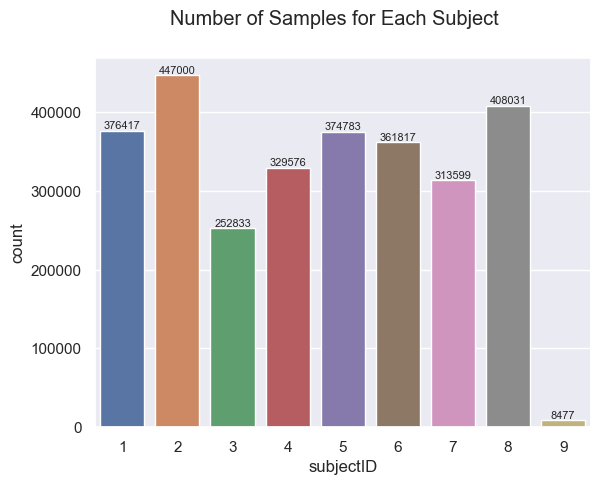

In [14]:
sns.barplot(data=subject_counts, x='subjectID',y='count')
for index, row in subject_counts.iterrows():
    plt.annotate(row['count'], (index, row['count']), ha='center', va='bottom', fontsize=8)
plt.suptitle('Number of Samples for Each Subject')
plt.show()

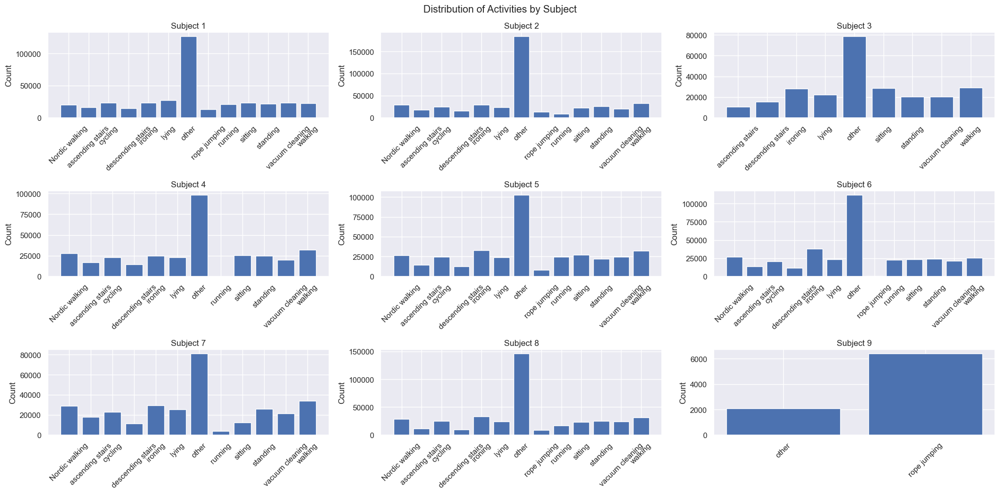

In [15]:
# Number of data points of each subject for each activity.
subject_ids = merged_data['subjectID'].unique()

num_rows = 3
num_cols = 3
num_plots = min(len(subject_ids), num_rows * num_cols)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))


for i, subject_id in enumerate(subject_ids[:num_plots]):
    data = merged_data[merged_data['subjectID'] == subject_id]
    counts = data['activity_name'].value_counts().sort_index()
    
    row_idx = i // num_cols
    col_idx = i % num_cols
    
    axes[row_idx, col_idx].bar(counts.index, counts.values)
    axes[row_idx, col_idx].set_ylabel('Count')
    axes[row_idx, col_idx].set_title(f'Subject {subject_id}')
    axes[row_idx, col_idx].tick_params(axis='x', rotation=45)
plt.suptitle('Distribution of Activities by Subject')
fig.tight_layout()
plt.show()

<font color=black size=3 > &emsp;**2) activityID**:<br/>
<font color=black size=2 > &emsp;&emsp; – 'rope_jumping' activity has only 49360 data points, and 'running' activity has 98199 data points which are less than other activities.<br/>
&emsp;&emsp; –  Note that we should be care about the **evaluation of the accuracy** and the **selection of algorithms** because of the imbalanced sample size.<br/>
&emsp;&emsp; – The data labeled with activityID=0 (other) should be discarded, since this data mainly
covers transient activities between performing different activities, e.g. going from one location to the next activity's location, or waiting for the preparation of some equipment.<br/>
&emsp;&emsp; – Each user performed nearly equal time by each activity.

In [15]:
merged_data['activityID']=merged_data['activityID'].astype(str)

In [16]:
activity_counts=merged_data.groupby(['activityID', 'activity_name']).size().reset_index(name='count')
print(activity_counts)

   activityID      activity_name   count
0           0              other  929661
1           1              lying  192523
2          12   ascending stairs  117216
3          13  descending stairs  104944
4          16    vacuum cleaning  175353
5          17            ironing  238690
6           2            sitting  185188
7          24       rope jumping   49360
8           3           standing  189931
9           4            walking  238761
10          5            running   98199
11          6            cycling  164600
12          7     Nordic walking  188107


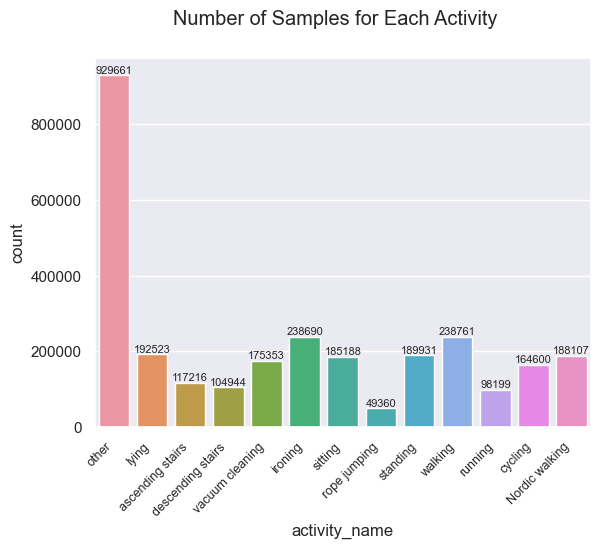

In [18]:
sns.barplot(data=activity_counts, x='activity_name',y='count')
for index, row in activity_counts.iterrows():
    plt.annotate(row['count'], (index, row['count']), ha='center', va='bottom', fontsize=8)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.suptitle('Number of Samples for Each Activity')
plt.show()

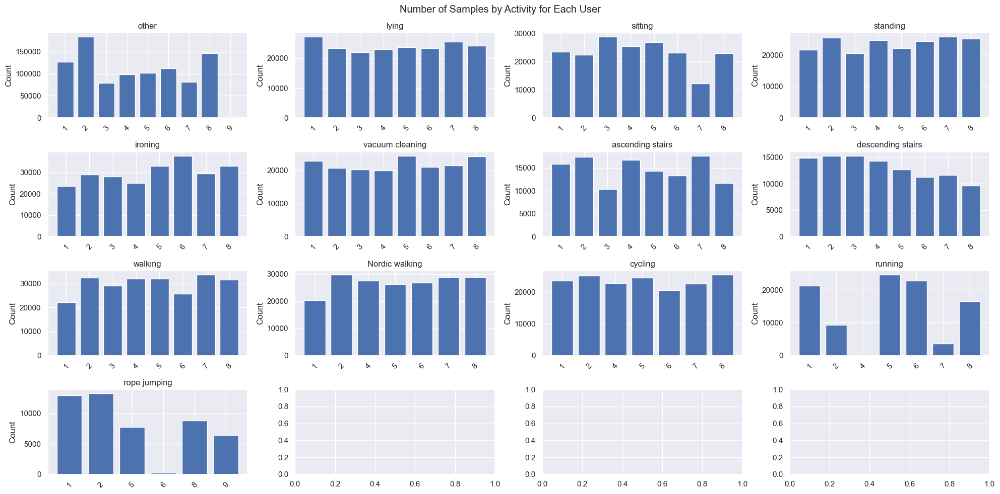

In [20]:
activity = merged_data['activity_name'].unique()
num_rows = 4
num_cols = 4
num_plots = min(len(activity), num_rows * num_cols)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10))


for i, activity in enumerate(activity[:num_plots]):
    data = merged_data[merged_data['activity_name'] == activity]
    counts = data['subjectID'].value_counts().sort_index()
    
    row_idx = i // num_cols
    col_idx = i % num_cols
    
    axes[row_idx, col_idx].bar(counts.index, counts.values)
    axes[row_idx, col_idx].set_ylabel('Count')
    axes[row_idx, col_idx].set_title(f'{activity}')
    axes[row_idx, col_idx].tick_params(axis='x', rotation=45)
plt.suptitle('Number of Samples by Activity for Each User')
fig.tight_layout()
plt.show()

<font color=black size=3 > &emsp; **3) Adjust sample size** <br/>
<font color=black size=2 >&emsp;&emsp; – As the sample size is imbalance for categorical variable 'activityID', especially 'rope jumping', I remove the records of subject 103, 104, 107 (uncompletely activities) and subject 106 (only performed 2.55 seconds for 'rope jumping');<br/>

In [17]:
merged_data=merged_data[~merged_data['subjectID'].isin(['3', '4', '6','7'])]

In [18]:
activity_counts=merged_data.groupby(['activity_name']).size().reset_index(name='count')
print(activity_counts)


        activity_name   count
0      Nordic walking  105163
1    ascending stairs   59196
2             cycling   98735
3   descending stairs   52494
4             ironing  118477
5               lying   98481
6               other  560467
7        rope jumping   49104
8             running   71681
9             sitting   95612
10           standing   94585
11    vacuum cleaning   92361
12            walking  118352


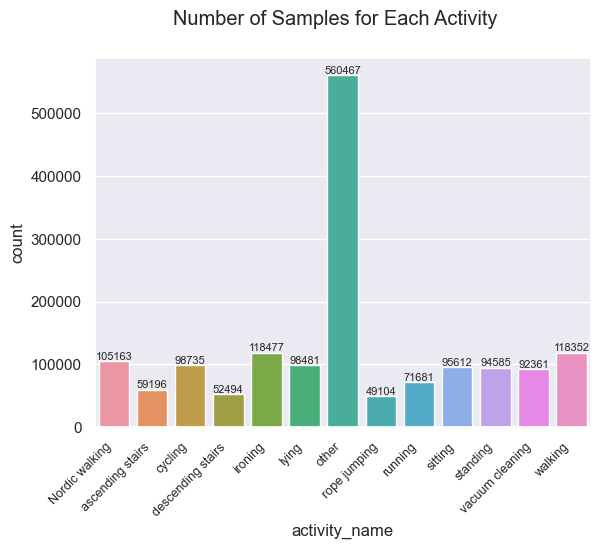

In [19]:
sns.barplot(data=activity_counts, x='activity_name',y='count')
for index, row in activity_counts.iterrows():
    plt.annotate(row['count'], (index, row['count']), ha='center', va='bottom', fontsize=8)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.suptitle('Number of Samples for Each Activity')
plt.show()

  subjectID   count
0         1  376417
1         2  447000
2         5  374783
3         8  408031
4         9    8477


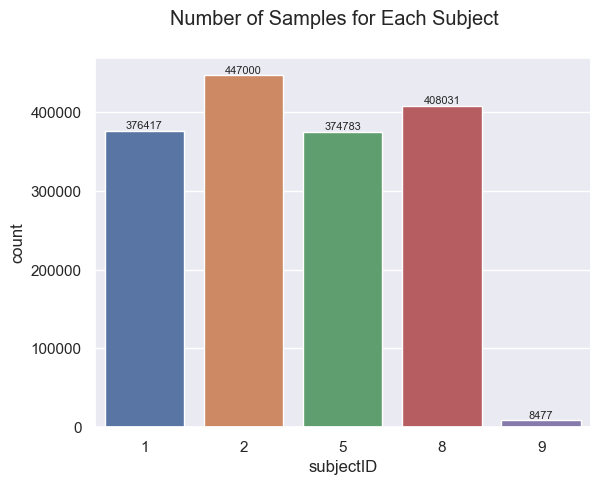

In [20]:
subject_counts=merged_data.groupby(['subjectID']).size().reset_index(name='count')
print(subject_counts)
sns.barplot(data=subject_counts, x='subjectID',y='count')
for index, row in subject_counts.iterrows():
    plt.annotate(row['count'], (index, row['count']), ha='center', va='bottom', fontsize=8)
plt.suptitle('Number of Samples for Each Subject')
plt.show()

In [21]:
merged_data=merged_data.reset_index(drop=True)
merged_data

,timestamp,subjectID,activityID,activity_name,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_ma,...,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_mag_ma,a_oriX,a_oriY,a_oriZ,a_oriW
0,8.38,1,0,other,104.0,30.0000,2.37223,8.60074,3.51048,9.587683,...,0.009250,-0.017580,-61.1888,-38.95990,-58.143800,92.965825,1.000000,0.000000,0.000000,0.000000
1,8.39,1,0,other,NaN,30.0000,2.18837,8.56560,3.66179,9.569074,...,-0.004638,0.000368,-59.8479,-38.89190,-58.525300,92.301472,1.000000,0.000000,0.000000,0.000000
2,8.40,1,0,other,NaN,30.0000,2.37357,8.60107,3.54898,9.602474,...,0.000148,0.022495,-60.7361,-39.41380,-58.399900,93.020803,1.000000,0.000000,0.000000,0.000000
3,8.41,1,0,other,NaN,30.0000,2.07473,8.52853,3.66021,9.509862,...,-0.020301,0.011275,-60.4091,-38.76350,-58.395600,92.530613,1.000000,0.000000,0.000000,0.000000
4,8.42,1,0,other,NaN,30.0000,2.22936,8.83122,3.70000,9.831098,...,-0.014303,-0.002823,-61.5199,-39.38790,-58.269400,93.442109,1.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1614703,100.19,9,0,other,NaN,25.1875,-4.71493,10.22250,4.66893,12.187247,...,-0.062676,-0.127084,-46.5153,3.58240,-0.035995,46.653060,0.598531,0.033615,0.799791,-0.031075
1614704,100.20,9,0,other,NaN,25.1875,-4.95932,10.37130,4.12594,12.214012,...,-0.027006,-0.089808,-45.7474,3.54453,0.108583,45.884639,0.598428,0.033012,0.799933,-0.030018
1614705,100.21,9,0,other,NaN,25.1875,-4.93997,9.83615,3.70468,11.613690,...,-0.038024,-0.064709,-46.3997,4.22078,0.105504,46.591397,0.598233,0.033172,0.800095,-0.029416
1614706,100.22,9,0,other,NaN,25.1875,-4.64941,9.11129,3.51904,10.817405,...,-0.025796,-0.064357,-46.5282,4.48593,0.530240,46.746958,0.598116,0.033427,0.800180,-0.029208


<font color=black size=4 >**1.6 Check the ditribution of numerical features** <br/>

In [22]:
print(merged_data.columns)

Index(['timestamp', 'subjectID', 'activityID', 'activity_name', 'heart rate',
       'h_temp', 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_ma', 'h_acc_6X',
       'h_acc_6Y', 'h_acc_6Z', 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
       'h_magX', 'h_magY', 'h_magZ', 'h_mag_ma', 'h_oriX', 'h_oriY', 'h_oriZ',
       'h_oriW', 'c_temp', 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_ma',
       'c_acc_6X', 'c_acc_6Y', 'c_acc_6Z', 'c_gyroX', 'c_gyroY', 'c_gyroZ',
       'c_gyro_ma', 'c_magX', 'c_magY', 'c_magZ', 'c_mag_ma', 'c_oriX',
       'c_oriY', 'c_oriZ', 'c_oriW', 'a_temp', 'a_acc_16X', 'a_acc_16Y',
       'a_acc_16Z', 'a_acc_ma', 'a_acc_6X', 'a_acc_6Y', 'a_acc_6Z',
       'a_gyro_ma', 'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_magX', 'a_magY',
       'a_magZ', 'a_mag_ma', 'a_oriX', 'a_oriY', 'a_oriZ', 'a_oriW'],
      dtype='object')


<font color=black size=3 > &emsp; 1) **heart rate** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –The heart rate between activities is different;<br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –Different subject also has different heart rate shape;<br/>

In [31]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1614708 entries, 0 to 1614707
Data columns (total 65 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   timestamp      1614708 non-null  float64
 1   subjectID      1614708 non-null  object 
 2   activityID     1614708 non-null  object 
 3   activity_name  1614708 non-null  object 
 4   heart rate     147362 non-null   float64
 5   h_temp         1606830 non-null  float64
 6   h_acc_16X      1606830 non-null  float64
 7   h_acc_16Y      1606830 non-null  float64
 8   h_acc_16Z      1606830 non-null  float64
 9   h_acc_ma       1606830 non-null  float64
 10  h_acc_6X       1606830 non-null  float64
 11  h_acc_6Y       1606830 non-null  float64
 12  h_acc_6Z       1606830 non-null  float64
 13  h_gyroX        1606830 non-null  float64
 14  h_gyroY        1606830 non-null  float64
 15  h_gyroZ        1606830 non-null  float64
 16  h_gyro_ma      1606830 non-null  float64
 17  h_magX  

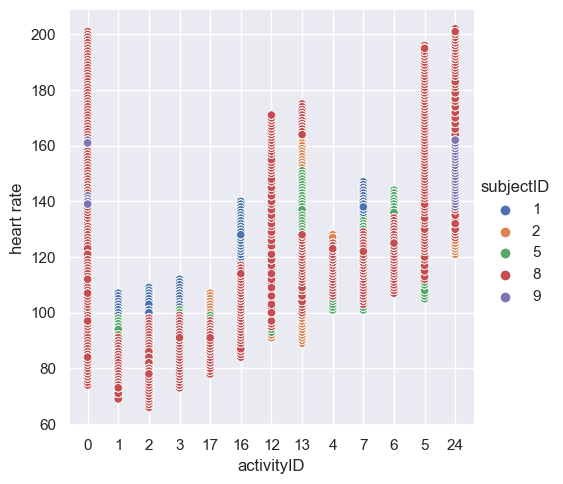

In [32]:
sns.relplot(data=merged_data,x='activityID',y='heart rate',hue='subjectID')

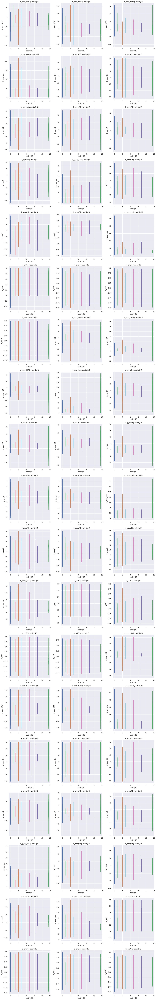

In [9]:
selected_vars = [ 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_ma', 
                 'h_acc_6X', 'h_acc_6Y', 'h_acc_6Z', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX', 'h_magY', 'h_magZ', 'h_mag_ma', 
                 'h_oriX', 'h_oriY', 'h_oriZ','h_oriW', 
                 
                 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_ma',
                 'c_acc_6X', 'c_acc_6Y', 'c_acc_6Z', 
                 'c_gyroX', 'c_gyroY', 'c_gyroZ','c_gyro_ma',
                 'c_magX', 'c_magY', 'c_magZ', 'c_mag_ma', 
                 'c_oriX','c_oriY', 'c_oriZ', 'c_oriW', 
                 
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z', 'a_acc_ma', 
                 'a_acc_6X', 'a_acc_6Y', 'a_acc_6Z', 
                 'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_gyro_ma',
                 'a_magX', 'a_magY','a_magZ', 'a_mag_ma',
                 'a_oriX', 'a_oriY', 'a_oriZ', 'a_oriW']
category_var = 'activityID'

num_rows = (len(selected_vars) + 2) // 3
num_cols = 3

fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5 * num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    
    for category in merged_data[category_var].unique():
        ax.plot(merged_data[category_var][merged_data[category_var] == category], 
                merged_data[var][merged_data[category_var] == category], label=category)

    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

<font color=black size=3 > &emsp; 2) **Temperature** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –The distribution of temperature is different between hand, chest and ankle, but the shape is similiar;<br/>

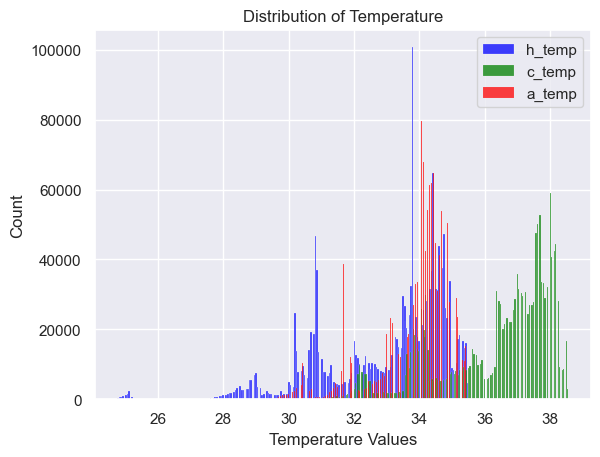

In [14]:
h_temp = merged_data['h_temp']
c_temp = merged_data['c_temp']
a_temp = merged_data['a_temp']
fig, ax = plt.subplots()
sns.histplot(h_temp, ax=ax, color='blue', label='h_temp')
sns.histplot(c_temp, ax=ax, color='green', label='c_temp')
sns.histplot(a_temp, ax=ax, color='red', label='a_temp')
ax.set_xlabel('Temperature Values')
ax.set_ylabel('Count')
ax.set_title('Distribution of Temperature')
ax.legend()
plt.show()

<font color=black size=3 > &emsp; 3) **Acceleration** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –hand<br/>
    &emsp;&emsp;&emsp; –chest<br/>
    &emsp;&emsp;&emsp; –ankle<br/>

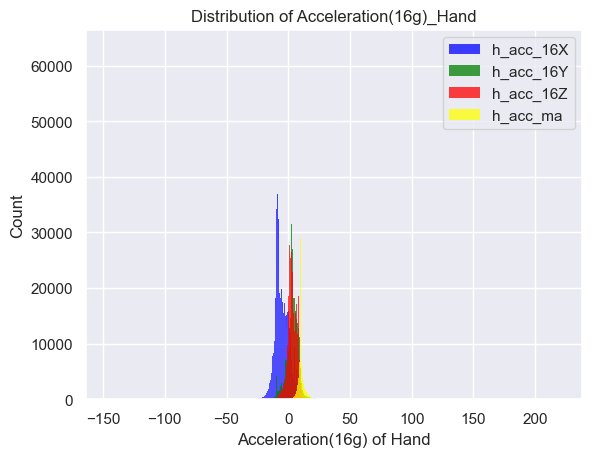

In [10]:
# hand
h_acc_16X = merged_data['h_acc_16X']
h_acc_16Y = merged_data['h_acc_16Y']
h_acc_16Z = merged_data['h_acc_16Z']
h_acc_ma = merged_data['h_acc_ma']

fig, ax = plt.subplots()
sns.histplot(h_acc_16X, ax=ax, color='blue', label='h_acc_16X')
sns.histplot(h_acc_16Y, ax=ax, color='green', label='h_acc_16Y')
sns.histplot(h_acc_16Z, ax=ax, color='red', label='h_acc_16Z')
sns.histplot(h_acc_ma, ax=ax, color='yellow', label='h_acc_ma')

ax.set_xlabel('Acceleration(16g) of Hand')
ax.set_ylabel('Count')
ax.set_title('Distribution of Acceleration(16g)_Hand')
ax.legend()
plt.show()

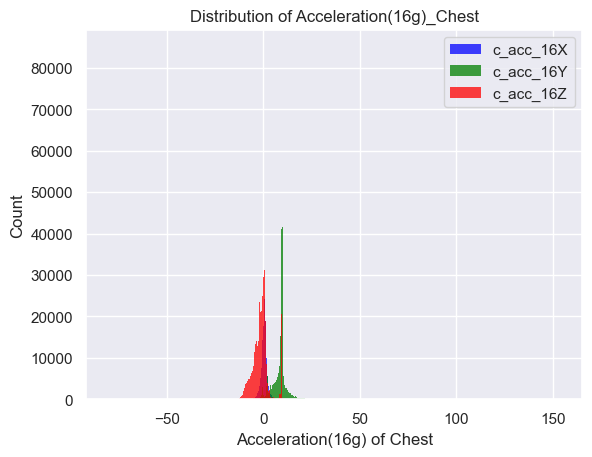

In [21]:
c_acc_16X = merged_data['c_acc_16X']
c_acc_16Y = merged_data['c_acc_16Y']
c_acc_16Z = merged_data['c_acc_16Z']
c_acc_ma = merged_data['c_acc_ma']

fig, ax = plt.subplots()
sns.histplot(c_acc_16X, ax=ax, color='blue', label='c_acc_16X')
sns.histplot(c_acc_16Y, ax=ax, color='green', label='c_acc_16Y')
sns.histplot(c_acc_16Z, ax=ax, color='red', label='c_acc_16Z')
sns.histplot(c_acc_ma, ax=ax, color='yellow', label='c_acc_ma')

ax.set_xlabel('Acceleration(16g) of Chest')
ax.set_ylabel('Count')
ax.set_title('Distribution of Acceleration(16g)_Chest')
ax.legend()
plt.show()

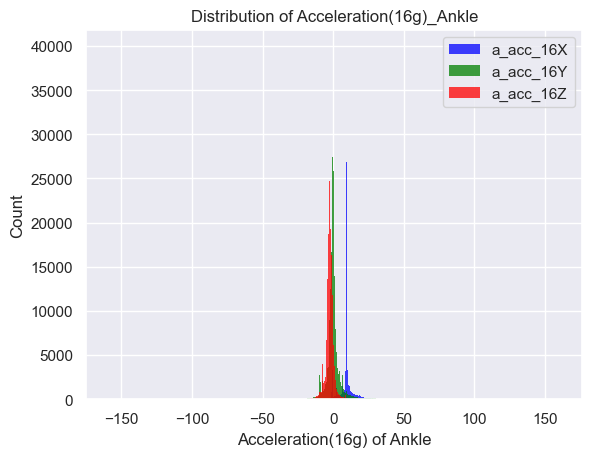

In [22]:
a_acc_16X = merged_data['a_acc_16X']
a_acc_16Y = merged_data['a_acc_16Y']
a_acc_16Z = merged_data['a_acc_16Z']
a_acc_ma = merged_data['a_acc_ma']

fig, ax = plt.subplots()
sns.histplot(a_acc_16X, ax=ax, color='blue', label='a_acc_16X')
sns.histplot(a_acc_16Y, ax=ax, color='green', label='a_acc_16Y')
sns.histplot(a_acc_16Z, ax=ax, color='red', label='a_acc_16Z')
sns.histplot(a_acc_ma, ax=ax, color='yellow', label='a_acc_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Acceleration(16g)_Ankle')
ax.legend()
plt.show()

<font color=black size=3 > &emsp; 4) **Gyroscope** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –hand<br/>
    &emsp;&emsp;&emsp; –chest<br/>
    &emsp;&emsp;&emsp; –ankle<br/>

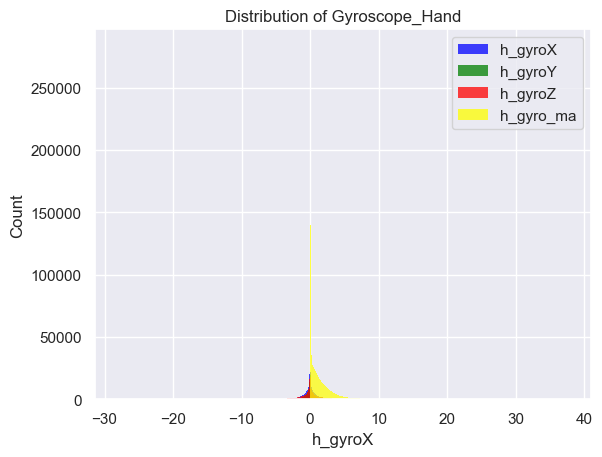

In [18]:
h_gyroX= merged_data['h_gyroX']
h_gyroY = merged_data['h_gyroY']
h_gyroZ  = merged_data['h_gyroZ']
h_gyro_ma  = merged_data['h_gyro_ma']

fig, ax = plt.subplots()
sns.histplot(h_gyroX, ax=ax, color='blue', label='h_gyroX')
sns.histplot(h_gyroY, ax=ax, color='green', label='h_gyroY')
sns.histplot(h_gyroZ, ax=ax, color='red', label='h_gyroZ')
sns.histplot(h_gyro_ma, ax=ax, color='yellow', label='h_gyro_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Gyroscope_Hand')
ax.legend()
plt.show()

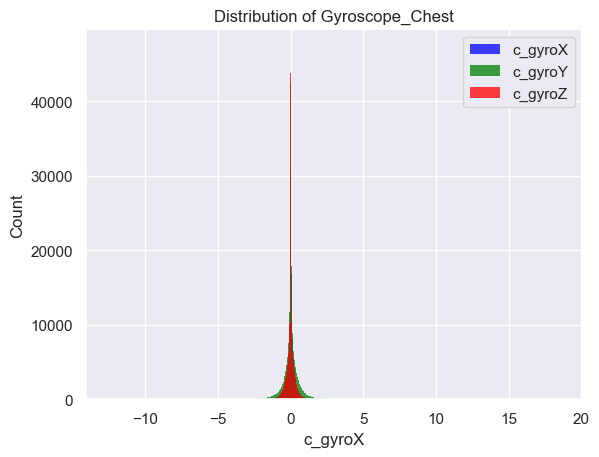

In [27]:
c_gyroX= merged_data['c_gyroX']
c_gyroY = merged_data['c_gyroY']
c_gyroZ  = merged_data['c_gyroZ']
c_gyro_ma  = merged_data['c_gyro_ma']

fig, ax = plt.subplots()
sns.histplot(c_gyroX, ax=ax, color='blue', label='c_gyroX')
sns.histplot(c_gyroY, ax=ax, color='green', label='c_gyroY')
sns.histplot(c_gyroZ, ax=ax, color='red', label='c_gyroZ')
sns.histplot(c_gyro_ma, ax=ax, color='yellow', label='c_gyro_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Gyroscope_Chest')
ax.legend()
plt.show()

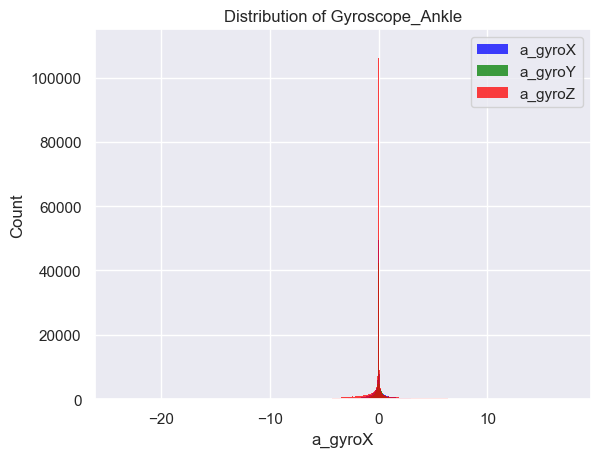

In [28]:
a_gyroX= merged_data['a_gyroX']
a_gyroY = merged_data['a_gyroY']
a_gyroZ  = merged_data['a_gyroZ']
a_gyro_ma  = merged_data['a_gyro_ma']

fig, ax = plt.subplots()
sns.histplot(a_gyroX, ax=ax, color='blue', label='a_gyroX')
sns.histplot(a_gyroY, ax=ax, color='green', label='a_gyroY')
sns.histplot(a_gyroZ, ax=ax, color='red', label='a_gyroZ')
sns.histplot(a_gyro_ma, ax=ax, color='yellow', label='a_gyro_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Gyroscope_Ankle')
ax.legend()
plt.show()

<font color=black size=3 > &emsp; 5) **Magnetometer** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –hand<br/>
    &emsp;&emsp;&emsp; –chest<br/>
    &emsp;&emsp;&emsp; –ankle<br/>

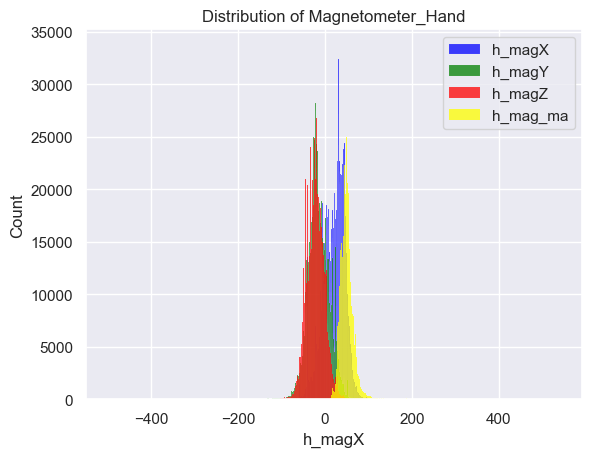

In [20]:
h_magX= merged_data['h_magX']
h_magY = merged_data['h_magY']
h_magZ  = merged_data['h_magZ']
h_mag_ma  = merged_data['h_mag_ma']

fig, ax = plt.subplots()
sns.histplot(h_magX, ax=ax, color='blue', label='h_magX')
sns.histplot(h_magY, ax=ax, color='green', label='h_magY')
sns.histplot(h_magZ, ax=ax, color='red', label='h_magZ')
sns.histplot(h_mag_ma, ax=ax, color='yellow', label='h_mag_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Magnetometer_Hand')
ax.legend()
plt.show()

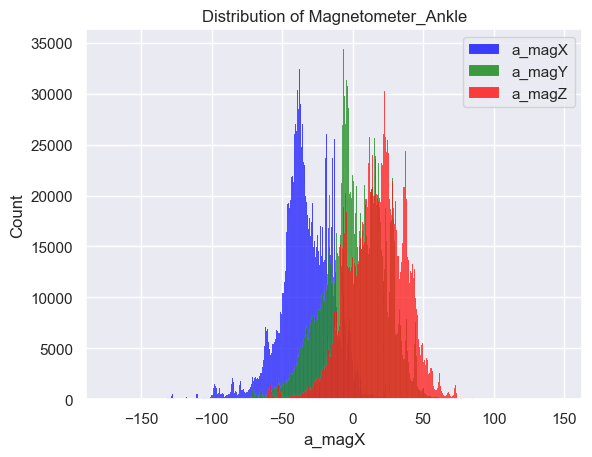

In [30]:
a_magX= merged_data['a_magX']
a_magY = merged_data['a_magY']
a_magZ  = merged_data['a_magZ']
a_mag_ma  = merged_data['a_mag_ma']

fig, ax = plt.subplots()
sns.histplot(a_magX, ax=ax, color='blue', label='a_magX')
sns.histplot(a_magY, ax=ax, color='green', label='a_magY')
sns.histplot(a_magZ, ax=ax, color='red', label='a_magZ')
sns.histplot(a_mag_ma, ax=ax, color='yellow', label='a_mag_ma')

ax.set_ylabel('Count')
ax.set_title('Distribution of Magnetometer_Ankle')
ax.legend()
plt.show()

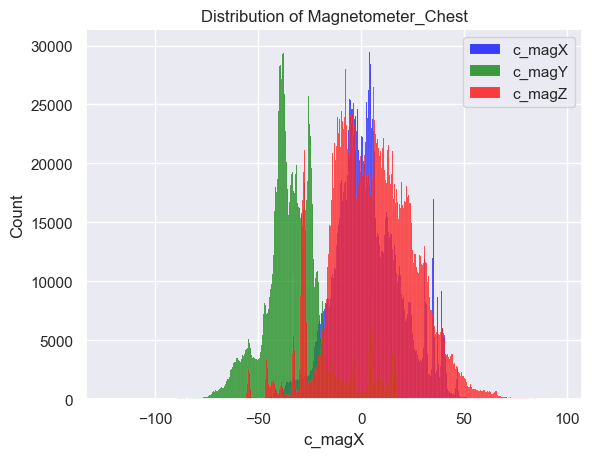

In [31]:
c_magX= merged_data['c_magX']
c_magY = merged_data['c_magY']
c_magZ  = merged_data['c_magZ']
c_mag_ma  = merged_data['c_mag_ma']

fig, ax = plt.subplots()
sns.histplot(c_magX, ax=ax, color='blue', label='c_magX')
sns.histplot(c_magY, ax=ax, color='green', label='c_magY')
sns.histplot(c_magZ, ax=ax, color='red', label='c_magZ')
ax.set_ylabel('Count')
ax.set_title('Distribution of Magnetometer_Chest')
ax.legend()
plt.show()

<font color=black size=3 > &emsp; 6) **Orientation** <br/>
<font color=black size=2 > &emsp;&emsp;&emsp; –hand<br/>
    &emsp;&emsp;&emsp; –chest<br/>
    &emsp;&emsp;&emsp; –ankle<br/>

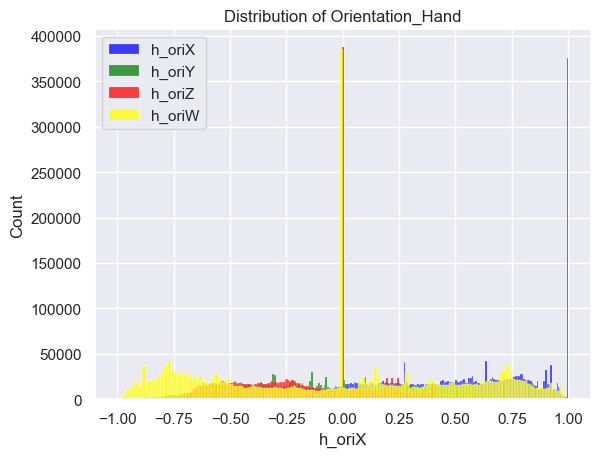

In [32]:
h_oriX= merged_data['h_oriX']
h_oriY = merged_data['h_oriY']
h_oriZ  = merged_data['h_oriZ']
h_oriW  = merged_data['h_oriW']

fig, ax = plt.subplots()
sns.histplot(h_oriX, ax=ax, color='blue', label='h_oriX')
sns.histplot(h_oriY, ax=ax, color='green', label='h_oriY')
sns.histplot(h_oriZ, ax=ax, color='red', label='h_oriZ')
sns.histplot(h_oriW, ax=ax, color='yellow', label='h_oriW')
ax.set_ylabel('Count')
ax.set_title('Distribution of Orientation_Hand')
ax.legend()
plt.show()

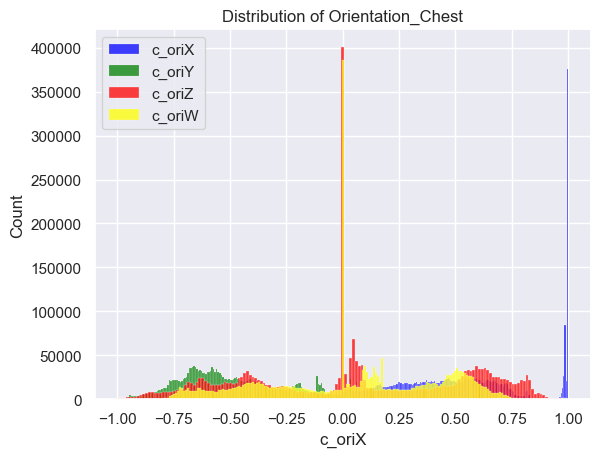

In [33]:
c_oriX= merged_data['c_oriX']
c_oriY = merged_data['c_oriY']
c_oriZ  = merged_data['c_oriZ']
c_oriW  = merged_data['c_oriW']

fig, ax = plt.subplots()
sns.histplot(c_oriX, ax=ax, color='blue', label='c_oriX')
sns.histplot(c_oriY, ax=ax, color='green', label='c_oriY')
sns.histplot(c_oriZ, ax=ax, color='red', label='c_oriZ')
sns.histplot(c_oriW, ax=ax, color='yellow', label='c_oriW')
ax.set_ylabel('Count')
ax.set_title('Distribution of Orientation_Chest')
ax.legend()
plt.show()


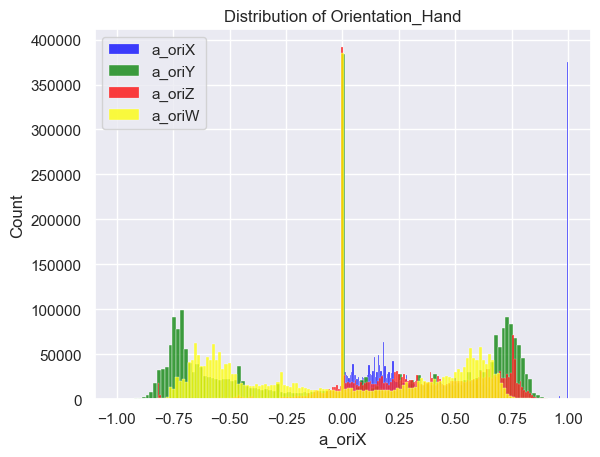

In [34]:
a_oriX= merged_data['a_oriX']
a_oriY = merged_data['a_oriY']
a_oriZ  = merged_data['a_oriZ']
a_oriW  = merged_data['a_oriW']

fig, ax = plt.subplots()
sns.histplot(a_oriX, ax=ax, color='blue', label='a_oriX')
sns.histplot(a_oriY, ax=ax, color='green', label='a_oriY')
sns.histplot(a_oriZ, ax=ax, color='red', label='a_oriZ')
sns.histplot(a_oriW, ax=ax, color='yellow', label='a_oriW')
ax.set_ylabel('Count')
ax.set_title('Distribution of Orientation_Hand')
ax.legend()
plt.show()


<font color=black size=5 >
2.Data Cleaning<br/>    
      
<font color=black size=4 >**2.1 Removing the irrelevant features**<br/>     
    
<font color=black size=3 >&emsp; 1) Remove the features related to **orientation**.<br/>
<font color=black size=2 >&emsp;&emsp; The features related to orientation is invalid in this dataset because of the problems with the hardare setup. <br/>    
    
<font color=black size=3 >&emsp;2) Remove the features related to **acceleration of 6g**.<br/>
<font color=black size=2 >&emsp;&emsp;  The acceleration of 6g is not precisely calibrated. Moreover, due to high impacts caused by certain movements (e.g. during running) with acceleration over 6g, it gets saturated sometimes. herefore, the use of the data from the first accelerometer (with the scale of ±16g) is recommended.<br/>    
    
<font color=black size=3 >&emsp; 3) Total **22 features** are removed from dataset.<br/>

In [23]:
df=merged_data.drop(columns=['h_acc_6X', 'h_acc_6Y','h_acc_6Z',
                    'h_oriX', 'h_oriY', 'h_oriZ', 'h_oriW',
                    'c_acc_6X', 'c_acc_6Y', 'c_acc_6Z',
                    'c_oriX', 'c_oriY','c_oriZ', 'c_oriW',
                    'a_acc_6X', 'a_acc_6Y', 'a_acc_6Z', 
                    'a_oriX', 'a_oriY', 'a_oriZ', 'a_oriW'])

<font color=black size=4 >**2.2 Dealing the Missing Value of 'heart rate**<br/>     
    
<font color=black size=3 >&emsp;**- Fill the NaN value of 'heart rate' with the last Non-null value** <br/>   
    
<font color=black size=2 >&emsp;Since data is given every 0.01s (due to the fact, that the IMUs have a sampling frequency of 100Hz),and the sampling frequency of the HR-monitor was only approximately 9Hz, the missing HR-values are also indicated with NaN in the data-files.<br/>

In [24]:
df.isna().sum()

timestamp              0
subjectID              0
activityID             0
activity_name          0
heart rate       1467346
h_temp              7878
h_acc_16X           7878
h_acc_16Y           7878
h_acc_16Z           7878
h_acc_ma            7878
h_gyroX             7878
h_gyroY             7878
h_gyroZ             7878
h_gyro_ma           7878
h_magX              7878
h_magY              7878
h_magZ              7878
h_mag_ma            7878
c_temp              2567
c_acc_16X           2567
c_acc_16Y           2567
c_acc_16Z           2567
c_acc_ma            2567
c_gyroX             2567
c_gyroY             2567
c_gyroZ             2567
c_gyro_ma           2567
c_magX              2567
c_magY              2567
c_magZ              2567
c_mag_ma            2567
a_temp              7712
a_acc_16X           7712
a_acc_16Y           7712
a_acc_16Z           7712
a_acc_ma            7712
a_gyro_ma           7712
a_gyroX             7712
a_gyroY             7712
a_gyroZ             7712


In [25]:
grouped_data = df.groupby('subjectID')

filled_data = []
for subject_id, group in grouped_data:
    group['heart rate'] = group['heart rate'].fillna(method='ffill')
    filled_data.append(group)
df = pd.concat(filled_data)

df = df.reset_index(drop=True)
df

,timestamp,subjectID,activityID,activity_name,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_ma,...,a_acc_16Z,a_acc_ma,a_gyro_ma,a_gyroX,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_mag_ma
0,8.38,1,0,other,104.0,30.0000,2.37223,8.60074,3.51048,9.587683,...,-0.099797,9.800563,0.021530,0.008300,0.009250,-0.017580,-61.1888,-38.95990,-58.143800,92.965825
1,8.39,1,0,other,104.0,30.0000,2.18837,8.56560,3.66179,9.569074,...,-0.215687,9.823830,0.008056,-0.006577,-0.004638,0.000368,-59.8479,-38.89190,-58.525300,92.301472
2,8.40,1,0,other,104.0,30.0000,2.37357,8.60107,3.54898,9.602474,...,0.092914,9.745176,0.022697,0.003014,0.000148,0.022495,-60.7361,-39.41380,-58.399900,93.020803
3,8.41,1,0,other,104.0,30.0000,2.07473,8.52853,3.66021,9.509862,...,0.054545,9.750370,0.023438,0.003175,-0.020301,0.011275,-60.4091,-38.76350,-58.395600,92.530613
4,8.42,1,0,other,104.0,30.0000,2.22936,8.83122,3.70000,9.831098,...,-0.060809,9.838315,0.019333,0.012698,-0.014303,-0.002823,-61.5199,-39.38790,-58.269400,93.442109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1614703,100.19,9,0,other,161.0,25.1875,-4.71493,10.22250,4.66893,12.187247,...,-3.273700,9.957866,0.146651,-0.037788,-0.062676,-0.127084,-46.5153,3.58240,-0.035995,46.653060
1614704,100.20,9,0,other,161.0,25.1875,-4.95932,10.37130,4.12594,12.214012,...,-3.308730,10.072622,0.116372,-0.068904,-0.027006,-0.089808,-45.7474,3.54453,0.108583,45.884639
1614705,100.21,9,0,other,161.0,25.1875,-4.93997,9.83615,3.70468,11.613690,...,-3.233400,10.120781,0.103238,-0.070888,-0.038024,-0.064709,-46.3997,4.22078,0.105504,46.591397
1614706,100.22,9,0,other,161.0,25.1875,-4.64941,9.11129,3.51904,10.817405,...,-3.311610,10.071555,0.071881,0.018961,-0.025796,-0.064357,-46.5282,4.48593,0.530240,46.746958


<font color=black size=4 > **2.3 Remove the data related to transient activities** <br/>   
    
<font color=black size=3 >&emsp;1) Regonize and drop possible **transient activities** <br/>
<font color=black size=2 >&emsp;&emsp;Since there is chance of mislabelling of data during the period of transitioning between one activity to other activity. To avoid dealing with eventual transient activities, 10 seconds from the beginning and the end of each labeled activity is deleted, respectively.

<Figure size 2000x1500 with 0 Axes>

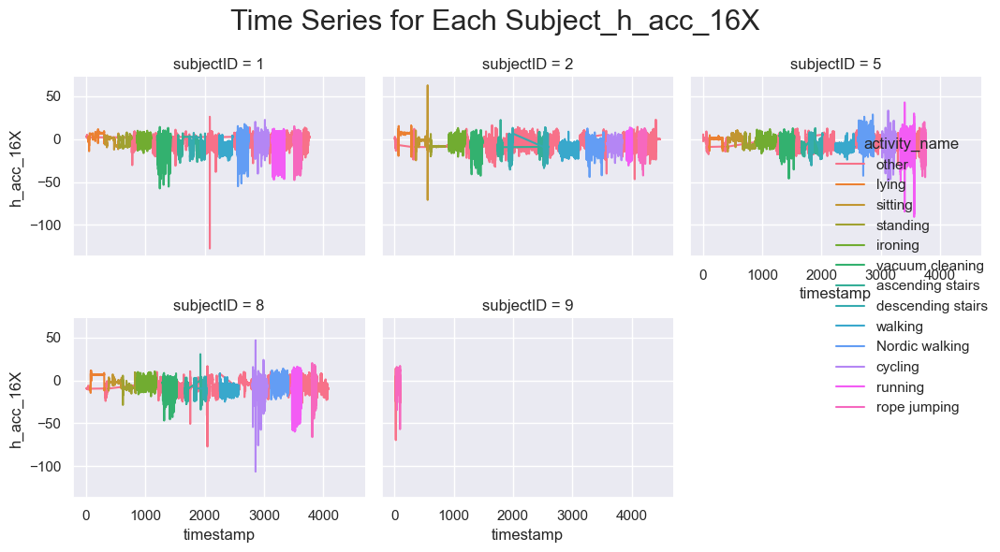

In [38]:
plt.figure(figsize=(20, 15))
sns.relplot(data=df, x='timestamp', y='h_acc_16X', col='subjectID', kind='line', hue='activity_name',
            col_wrap=3, height=3, legend=True)
# Adjust legend position
# g.fig.subplots_adjust(top=0.9)
# g.fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=5)

plt.suptitle("Time Series for Each Subject_h_acc_16X", fontsize=22)
plt.tight_layout()
plt.show()

<Figure size 2000x1500 with 0 Axes>

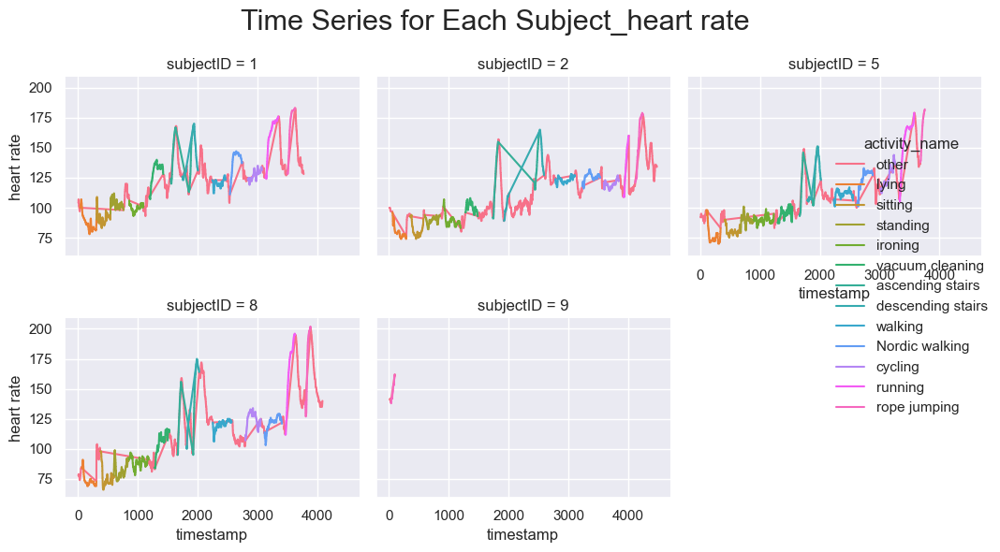

In [20]:
plt.figure(figsize=(20, 15))
sns.relplot(data=df, x='timestamp', y='heart rate', col='subjectID', kind='line', hue='activity_name',
            col_wrap=3, height=3, legend=True)

plt.suptitle("Time Series for Each Subject_heart rate", fontsize=22)
plt.tight_layout()
plt.show()

In [21]:
freq = 5
df['activity_block'] = ((df['activityID'].shift(1) != df['activityID']) | (df['subjectID'].shift(1) != df['subjectID'])).astype(int).cumsum()

numblocks = df['activity_block'].max() 
drop_index = []
for block in range(1, numblocks+1):
    drop_index += list(df[df['activity_block']==block].head(10 * freq).index)
    drop_index += list(df[df['activity_block']==block].tail(10 * freq).index)
    
df = df.drop(drop_index)
df.drop(['activity_block'], axis = 1, inplace  = True)
df.reset_index(drop = True, inplace = True)

<font color=black size=3 >&emsp; 2) Drop data labeled with **'activityID' = 0**<br/>
<font color=black size=2 >&emsp;&emsp;Data labeled with 'activityID' = 0 mainly covers transient activities between performing different activities,should be discarded.

In [22]:
# 1048541
df = df[df['activityID'] != 0]

<font color=black size=4 >**2.4 Drop all other NaN values**

In [24]:
df.isna().sum()

timestamp           0
subjectID           0
activityID          0
activity_name       0
heart rate          0
h_temp           6209
h_acc_16X        6209
h_acc_16Y        6209
h_acc_16Z        6209
h_acc_ma         6209
h_gyroX          6209
h_gyroY          6209
h_gyroZ          6209
h_gyro_ma        6209
h_magX           6209
h_magY           6209
h_magZ           6209
h_mag_ma         6209
c_temp           1704
c_acc_16X        1704
c_acc_16Y        1704
c_acc_16Z        1704
c_acc_ma         1704
c_gyroX          1704
c_gyroY          1704
c_gyroZ          1704
c_gyro_ma        1704
c_magX           1704
c_magY           1704
c_magZ           1704
c_mag_ma         1704
a_temp           5423
a_acc_16X        5423
a_acc_16Y        5423
a_acc_16Z        5423
a_acc_ma         5423
a_gyro_ma        5423
a_gyroX          5423
a_gyroY          5423
a_gyroZ          5423
a_magX           5423
a_magY           5423
a_magZ           5423
a_mag_ma         5423
dtype: int64

In [25]:
# 1035585
df = df.dropna(how='any', axis=0)

<font color=black size=4 >**2.5 Remove rows that have duplicate values.**

In [27]:
# There is no duplicate data.
df1 = df.drop_duplicates()
df1.shape

(1035585, 44)

 <font color=black size=4 > **2.6 Detecting Outliers**

In [43]:
print(df.columns)

Index(['timestamp', 'subjectID', 'activityID', 'activity_name', 'heart rate',
       'h_temp', 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_ma', 'h_gyroX',
       'h_gyroY', 'h_gyroZ', 'h_gyro_ma', 'h_magX', 'h_magY', 'h_magZ',
       'h_mag_ma', 'c_temp', 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_ma',
       'c_gyroX', 'c_gyroY', 'c_gyroZ', 'c_gyro_ma', 'c_magX', 'c_magY',
       'c_magZ', 'c_mag_ma', 'a_temp', 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z',
       'a_acc_ma', 'a_gyro_ma', 'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_magX',
       'a_magY', 'a_magZ', 'a_mag_ma'],
      dtype='object')


In [33]:
df['activityID']=df['activityID'].astype(str)
df['subjectID']=df['subjectID'].astype(str)

NameError: name 'df' is not defined

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1035585 entries, 2828 to 1603494
Data columns (total 44 columns):
 #   Column         Non-Null Count    Dtype  
---  ------         --------------    -----  
 0   timestamp      1035585 non-null  float64
 1   subjectID      1035585 non-null  object 
 2   activityID     1035585 non-null  object 
 3   activity_name  1035585 non-null  object 
 4   heart rate     1035585 non-null  float64
 5   h_temp         1035585 non-null  float64
 6   h_acc_16X      1035585 non-null  float64
 7   h_acc_16Y      1035585 non-null  float64
 8   h_acc_16Z      1035585 non-null  float64
 9   h_acc_ma       1035585 non-null  float64
 10  h_gyroX        1035585 non-null  float64
 11  h_gyroY        1035585 non-null  float64
 12  h_gyroZ        1035585 non-null  float64
 13  h_gyro_ma      1035585 non-null  float64
 14  h_magX         1035585 non-null  float64
 15  h_magY         1035585 non-null  float64
 16  h_magZ         1035585 non-null  float64
 17  h_mag

<font color=black size=3 > **1) Detecting Outliers for subject101**

In [31]:
s1 = df[df['subjectID'] == '1'].copy()
s1.shape

(245818, 44)

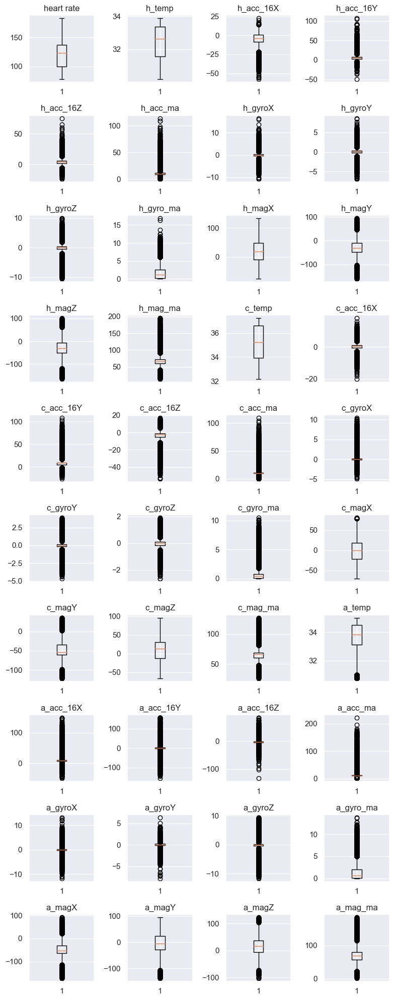

In [48]:
selected_vars = [ 'heart rate', 
                 'h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
fig, axs = plt.subplots(nrows=10, ncols=4, figsize=(8, 20))
for i, var in enumerate(selected_vars):
    row = i // 4
    col = i % 4
    
    ax = axs[row, col]
    ax.boxplot(s1[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

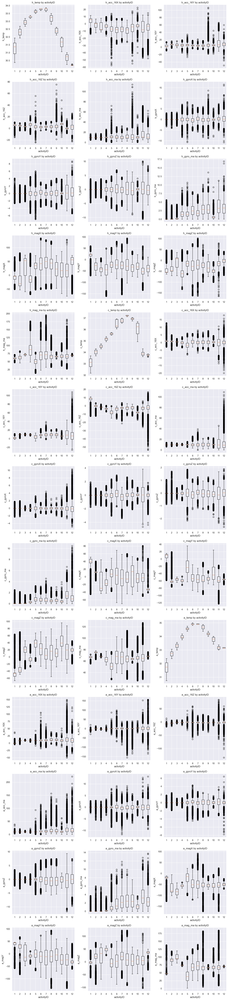

In [32]:
selected_vars = ['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
category_var = 'activityID'
num_rows = (len(selected_vars) + 2) // 3
num_cols = 3
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.boxplot([s1[var][s1[category_var] == category] for category in s1[category_var].unique()])
    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

In [33]:
# Remove the outliers
s1_out = s1[(s1['h_acc_16X'] <= 20) & (s1['h_acc_16X'] >= -35) &
        (s1['h_acc_16Y'] <= 45) & (s1['h_acc_16Y'] > -20) &
        (s1['h_acc_16Z'] <= 20) & (s1['h_acc_16Z'] >= -15) &
        (s1['h_gyroX'] <= 5) & (s1['h_gyroX'] >= -5) &
        (s1['h_gyroY'] <= 4) & (s1['h_gyroY'] >= -4) &
        (s1['h_gyroZ'] <= 8) & (s1['h_gyroZ'] >= -8) &
        (s1['h_magY'] <= 70) & (s1['h_magY'] >= -140) &
        (s1['h_magZ'] <= 60) & (s1['h_magZ'] >= -130) &
        
        (s1['c_acc_16X'] <= 7) & (s1['c_acc_16X'] >= -10) &
        (s1['c_acc_16Y'] <= 50) & (s1['c_acc_16Y'] >= -30) &
        (s1['c_acc_16Z'] <= 15) & (s1['c_acc_16Z'] >= -25) &
        (s1['c_gyroX'] <= 3) & (s1['c_gyroX'] >= -4) &
        (s1['c_gyroY'] <= 4) & (s1['c_gyroY'] >= -4) &
        (s1['c_gyroZ'] <= 1.6) & (s1['c_gyroZ'] >= -2) &
        (s1['c_magX'] <= 70) & (s1['c_magX'] >= -70) &
        (s1['c_magY'] <= 70) & (s1['c_magY'] >= -100) &
            
        (s1['a_acc_16X'] <= 50) & (s1['a_acc_16X'] >= -25) &
        (s1['a_acc_16Y'] <= 50) & (s1['a_acc_16Y'] >= -60) &
        (s1['a_acc_16Z'] <= 25) & (s1['a_acc_16Z'] >= -50) &
        (s1['a_gyroX'] <= 5) & (s1['a_gyroX'] >= -8) &
        (s1['a_gyroY'] <= 3) & (s1['a_gyroY'] >= -3) &
        (s1['a_gyroZ'] <= 10) & (s1['a_gyroZ'] >= -10) &
        (s1['a_magX'] <= 50) & (s1['a_magX'] >= -150) &
        (s1['a_magY'] <= 100) & (s1['a_magY'] >= -120) &
        (s1['a_magZ'] <= 110) & (s1['a_magZ'] >= -90)&

        (s1['h_acc_ma'] <= 40) & (s1['h_acc_ma'] >= -20) &
        (s1['h_gyro_ma'] <= 11) & (s1['h_gyro_ma'] >= -16) & 
        (s1['h_mag_ma'] <=150) & (s1['h_mag_ma'] >=25) &
            
        (s1['c_acc_ma'] <= 50) & (s1['c_acc_ma'] >= -10) &
       (s1['c_gyro_ma'] <= 4) & (s1['c_gyro_ma'] >= -8) & 
         (s1['c_mag_ma'] <= 105) & (s1['c_mag_ma'] >= 37) &
            
        (s1['a_acc_ma'] <= 50) & (s1['a_acc_ma'] >= -30) &
       (s1['a_gyro_ma'] <= 10) & (s1['a_gyro_ma'] >= -14)  &
       (s1['a_mag_ma'] <= 125) & (s1['a_mag_ma'] >= -4)]

s1_out .shape

(230544, 44)

<font color=black size=3 > **2) Detecting Outliers for subject102**

In [34]:
s2 = df[df['subjectID'] == '2'].copy()
s2.shape

(257729, 44)

IndexError: index 8 is out of bounds for axis 0 with size 8

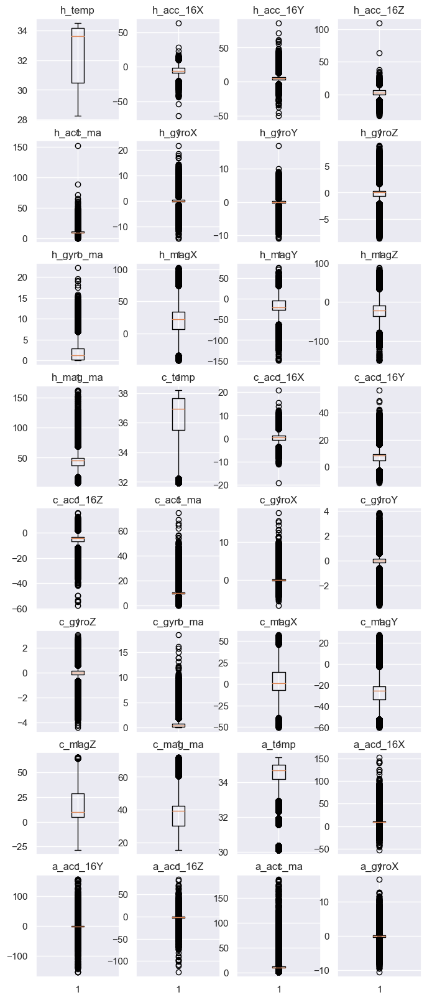

In [29]:
selected_vars = ['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
fig, axs = plt.subplots(nrows=8, ncols=4, figsize=(8, 20))
for i, var in enumerate(selected_vars):
    row = i // 4
    col = i % 4
    
    ax = axs[row, col]
    ax.boxplot(s2[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

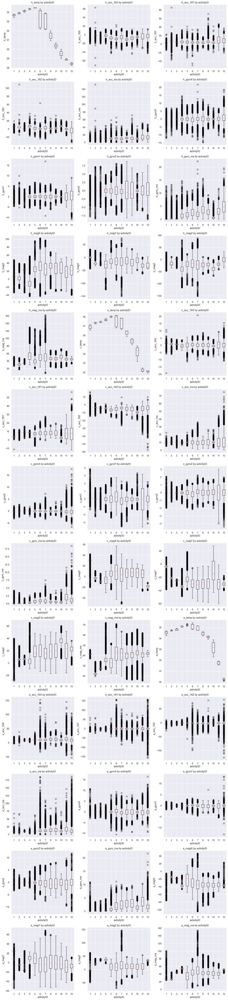

In [30]:
selected_vars = ['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
category_var = 'activityID'
num_rows = (len(selected_vars) + 2) // 3
num_cols = 3
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.boxplot([s2[var][s2[category_var] == category] for category in s2[category_var].unique()])
    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

In [35]:
# Rmove the outliers of subject102
s2_out = s2[(s2['h_acc_16X'] <= 16) & (s2['h_acc_16X'] >= -30) &
        (s2['h_acc_16Y'] <= 40) & (s2['h_acc_16Y'] > -17) &
        (s2['h_acc_16Z'] <= 20) & (s2['h_acc_16Z'] >= -20) &
        (s2['h_gyroX'] <= 10) & (s2['h_gyroX'] >= -8) &
        (s2['h_gyroY'] <= 6) & (s2['h_gyroY'] >= -8) &
        (s2['h_gyroZ'] <= 7.5) & (s2['h_gyroZ'] >= -7.5) &
        (s2['h_magX'] <= 80) & (s2['h_magX'] >= -40) &            
        (s2['h_magY'] <= 50) & (s2['h_magY'] >= -100) &
        (s2['h_magZ'] <= 50) & (s2['h_magZ'] >= -100) &
            
        (s2['c_acc_16X'] <= 10) & (s2['c_acc_16X'] >= -8) &
        (s2['c_acc_16Y'] <= 35) & (s2['c_acc_16Y'] >= -10) &
        (s2['c_acc_16Z'] <= 10) & (s2['c_acc_16Z'] >= -20) &
       (s2['c_magX'] <= 50) & (s2['c_magX'] >= -50) &  
        (s2['c_gyroX'] <= 4) & (s2['c_gyroX'] >= -5) &
        (s2['c_gyroY'] <= 3) & (s2['c_gyroY'] >= -3) &
        (s2['c_gyroZ'] <= 5) & (s2['c_gyroZ'] >= -3.5) &

        (s2['a_acc_16X'] <= 60) & (s2['a_acc_16X'] >= -25) &
        (s2['a_acc_16Y'] <= 50) & (s2['a_acc_16Y'] >= -60) &
        (s2['a_acc_16Z'] <= 25) & (s2['a_acc_16Z'] >= -50) &
        (s2['a_gyroX'] <= 5) & (s2['a_gyroX'] >= -5) &
        (s2['a_gyroY'] <= 5) & (s2['a_gyroY'] >= -5) &
        (s2['a_gyroZ'] <= 7) & (s2['a_gyroZ'] >= -10) &
        (s2['a_magX'] <= 20) & (s2['a_magX'] >= -80) &
        (s2['a_magY'] <= 60) & (s2['a_magY'] >= -120) &
        (s2['a_magZ'] <= 100) & (s2['a_magZ'] >= -50)&

        (s2['h_acc_ma'] <= 40) & (s2['h_acc_ma'] >= -20) &
        (s2['h_gyro_ma'] <= 13) & (s2['h_gyro_ma'] >= -16) & 
        (s2['h_mag_ma'] <=90) & (s2['h_mag_ma'] >= -54) &
            
        (s2['c_acc_ma'] <= 32) & (s2['c_acc_ma'] >= -10) &
       (s2['c_gyro_ma'] <= 6) & (s2['c_gyro_ma'] >= -16) & 
         (s2['c_mag_ma'] <= 68) & (s2['c_mag_ma'] >= 20) &
            
        (s2['a_acc_ma'] <= 50) & (s2['a_acc_ma'] >= -30) &
       (s2['a_gyro_ma'] <= 10) & (s2['a_gyro_ma'] >= -14)  &
       (s2['a_mag_ma'] <= 90) & (s2['a_mag_ma'] >= -4)
]
s2_out .shape

(248092, 44)

<font color=black size=3 >**3) Detecting Outliers for subject105**

In [36]:
s5 = df[df['subjectID'] == '5'].copy()
s5.shape

(267918, 44)

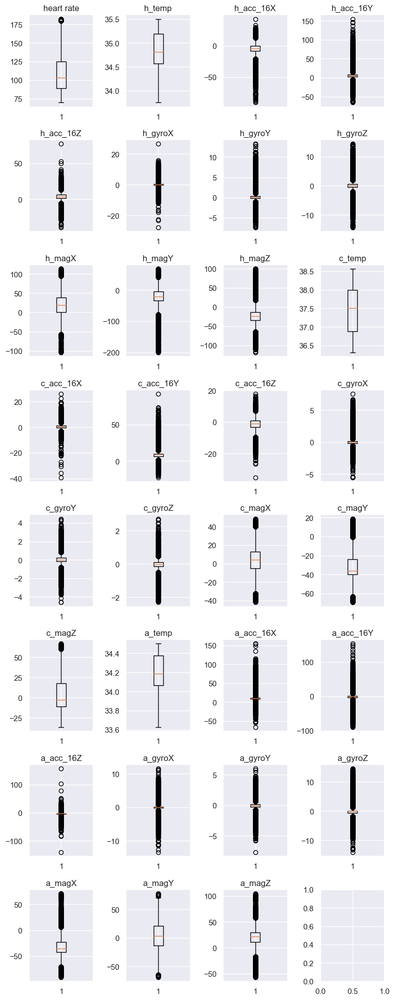

In [38]:
selected_vars = [ 'heart rate', 'h_temp', 'h_acc_16X', 'h_acc_16Y',
                 'h_acc_16Z', 'h_gyroX', 'h_gyroY', 'h_gyroZ', 
                 'h_magX','h_magY','h_magZ', 'c_temp',
                 'c_acc_16X','c_acc_16Y', 'c_acc_16Z','c_gyroX',
                 'c_gyroY', 'c_gyroZ', 'c_magX', 'c_magY',
                 'c_magZ', 'a_temp','a_acc_16X', 'a_acc_16Y', 
                 'a_acc_16Z', 'a_gyroX', 'a_gyroY','a_gyroZ', 
                 'a_magX', 'a_magY', 'a_magZ']
fig, axs = plt.subplots(nrows=8, ncols=4, figsize=(8, 20))
for i, var in enumerate(selected_vars):
    row = i // 4
    col = i % 4
    
    ax = axs[row, col]
    ax.boxplot(s5[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

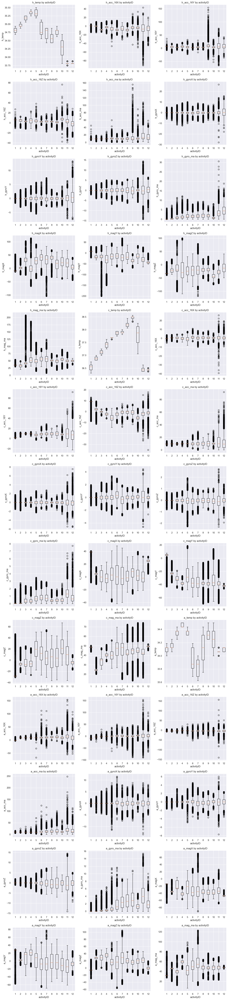

In [37]:
selected_vars =[ 'h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
category_var = 'activityID'
num_rows = (len(selected_vars) + 2) // 3
num_cols = 3
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.boxplot([s5[var][s5[category_var] == category] for category in s5[category_var].unique()])
    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

In [37]:
# Rmove the outliers of subject105
s5_out = s5[(s5['h_acc_16X'] <= 20) & (s5['h_acc_16X'] >= -30) &
        (s5['h_acc_16Y'] <= 50) & (s5['h_acc_16Y'] > -30) &
        (s5['h_acc_16Z'] <= 20) & (s5['h_acc_16Z'] >= -10) &
        (s5['h_gyroX'] <= 10) & (s5['h_gyroX'] >= -10) &
        (s5['h_gyroY'] <= 5.5) & (s5['h_gyroY'] >= -5) &
        (s5['h_gyroZ'] <= 8) & (s5['h_gyroZ'] >= -8) &
        (s5['h_magX'] <=75) & (s5['h_magX'] >= -40) &            
        (s5['h_magY'] <= 40) & (s5['h_magY'] >= -95) &
        (s5['h_magZ'] <= 90) & (s5['h_magZ'] >= -100) &
            
        (s5['c_acc_16X'] <= 10) & (s5['c_acc_16X'] >= -10) &
        (s5['c_acc_16Y'] <= 30) & (s5['c_acc_16Y'] >= -30) &
        (s5['c_acc_16Z'] <= 10) & (s5['c_acc_16Z'] >= -15) &
            
        (s5['c_gyroX'] <= 2) & (s5['c_gyroX'] >= -2) &
        (s5['c_gyroY'] <= 3) & (s5['c_gyroY'] >= -3) &
        (s5['c_gyroZ'] <= 1) & (s5['c_gyroZ'] >= -1.5) &
        (s5['c_magY'] <= 15) & (s5['c_magY'] >= -60) &  

        (s5['a_acc_16X'] <= 40) & (s5['a_acc_16X'] >= -40) &
        (s5['a_acc_16Y'] <= 40) & (s5['a_acc_16Y'] >= -40) &
        (s5['a_acc_16Z'] <= 40) & (s5['a_acc_16Z'] >= -50) &
        (s5['a_gyroX'] <= 5) & (s5['a_gyroX'] >= -5) &
        (s5['a_gyroY'] <=3) & (s5['a_gyroY'] >= -3) &
        (s5['a_gyroZ'] <= 13) & (s5['a_gyroZ'] >= -13) &
        (s5['a_magX'] <= 40) & (s5['a_magX'] >= -90) &
        (s5['a_magY'] <= 60) & (s5['a_magY'] >= -66) &
        (s5['a_magZ'] <= 80) & (s5['a_magZ'] >= -50)&
        
        (s5['h_acc_ma'] <= 50) & (s5['h_acc_ma'] >= -20) &
        (s5['h_gyro_ma'] <= 13) & (s5['h_gyro_ma'] >= -16) & 
        (s5['h_mag_ma'] <=90) & (s5['h_mag_ma'] >= 15) &
            
        (s5['c_acc_ma'] <= 42) & (s5['c_acc_ma'] >= -10) &
       (s5['c_gyro_ma'] <= 3.5) & (s5['c_gyro_ma'] >= -16) & 
         (s5['c_mag_ma'] <= 70) & (s5['c_mag_ma'] >= 20) &
            
        (s5['a_acc_ma'] <= 50) & (s5['a_acc_ma'] >= -30) &
       (s5['a_gyro_ma'] <= 12) & (s5['a_gyro_ma'] >= -14)  &
       (s5['a_mag_ma'] <= 90) & (s5['a_mag_ma'] >= -4)
]
s5_out .shape


(249631, 44)

 <font color=black size=3 >**4) Detecting Outliers for subject108**

In [38]:
s8 = df[df['subjectID'] == '8'].copy()
s8.shape

(257834, 44)

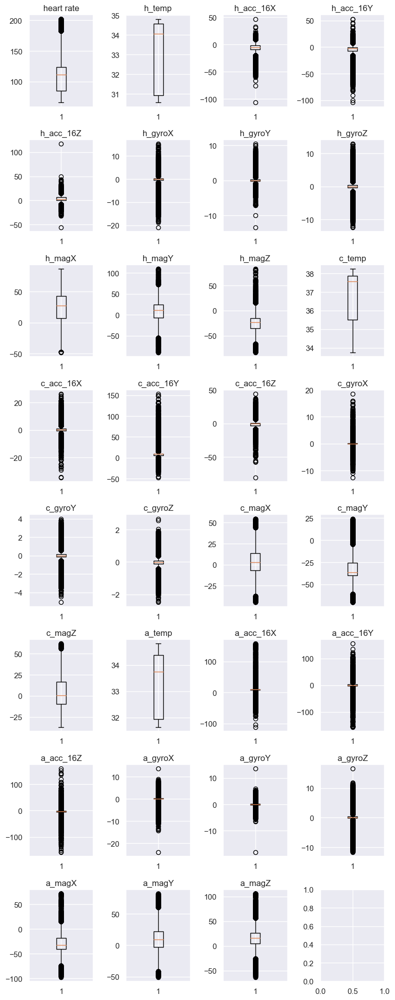

In [61]:
selected_vars = [ 'heart rate', 'h_temp', 'h_acc_16X', 'h_acc_16Y',
                 'h_acc_16Z', 'h_gyroX', 'h_gyroY', 'h_gyroZ', 
                 'h_magX','h_magY','h_magZ', 'c_temp',
                 'c_acc_16X','c_acc_16Y', 'c_acc_16Z','c_gyroX',
                 'c_gyroY', 'c_gyroZ', 'c_magX', 'c_magY',
                 'c_magZ', 'a_temp','a_acc_16X', 'a_acc_16Y', 
                 'a_acc_16Z', 'a_gyroX', 'a_gyroY','a_gyroZ', 
                 'a_magX', 'a_magY', 'a_magZ']
fig, axs = plt.subplots(nrows=8, ncols=4, figsize=(8, 20))
for i, var in enumerate(selected_vars):
    row = i // 4
    col = i % 4
    
    ax = axs[row, col]
    ax.boxplot(s8[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

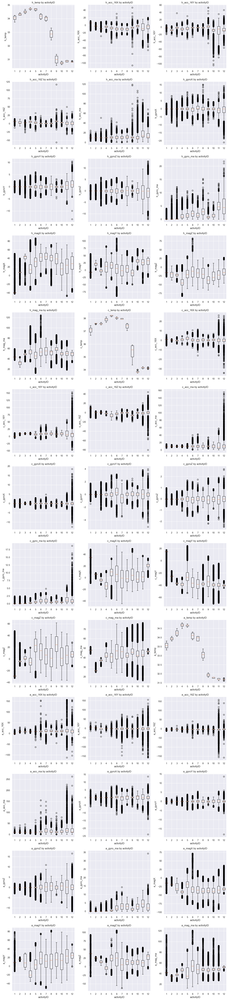

In [43]:
selected_vars =['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
category_var = 'activityID'
num_rows = (len(selected_vars) + 2) // 3
num_cols = 3
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.boxplot([s8[var][s8[category_var] == category] for category in s8[category_var].unique()])
    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

In [39]:
s8_out = s8[(s8['h_acc_16X'] <= 20) & (s8['h_acc_16X'] >= -40) &
        (s8['h_acc_16Y'] <= 20) & (s8['h_acc_16Y'] > -50) &
        (s8['h_acc_16Z'] <= 25) & (s8['h_acc_16Z'] >= -13) &
            
        (s8['h_gyroX'] <= 7) & (s8['h_gyroX'] >= -8) &
        (s8['h_gyroY'] <= 7) & (s8['h_gyroY'] >= -7) &
        (s8['h_gyroZ'] <= 10) & (s8['h_gyroZ'] >= -10) &
            
        (s8['h_magX'] <= 80) & (s8['h_magX'] >= -60) &            
        (s8['h_magY'] <= 75) & (s8['h_magY'] >= -60) &
        (s8['h_magZ'] <= 50) & (s8['h_magZ'] >= -75) &
            
        (s8['c_acc_16X'] <= 9) & (s8['c_acc_16X'] >= -9) &
        (s8['c_acc_16Y'] <= 50) & (s8['c_acc_16Y'] >= -25) &
        (s8['c_acc_16Z'] <= 18) & (s8['c_acc_16Z'] >= -18) &
            
        (s8['c_gyroX'] <= 4) & (s8['c_gyroX'] >= -3) &
        (s8['c_gyroY'] <= 3) & (s8['c_gyroY'] >= -3) &
        (s8['c_gyroZ'] <= 1.5) & (s8['c_gyroZ'] >= -1.5) &
            
        (s8['c_magY'] <= 20) & (s8['c_magY'] >= -60) &  

        (s8['a_acc_16X'] <= 50) & (s8['a_acc_16X'] >= -40) &
        (s8['a_acc_16Y'] <= 40) & (s8['a_acc_16Y'] >= -40) &
        (s8['a_acc_16Z'] <= 30) & (s8['a_acc_16Z'] >= -30) &
            
        (s8['a_gyroX'] <= 5) & (s8['a_gyroX'] >= -5) &
        (s8['a_gyroY'] <= 5) & (s8['a_gyroY'] >= -4) &
        (s8['a_gyroZ'] <= 15) & (s8['a_gyroZ'] >= -10) &
            
        (s8['a_magX'] <= 25) & (s8['a_magX'] >= -75) &
        (s8['a_magY'] <= 80) & (s8['a_magY'] >= -40) &
        (s8['a_magZ'] <= 100) & (s8['a_magZ'] >= -60)&
            
        (s8['h_acc_ma'] <= 40) & (s8['h_acc_ma'] >= -20) &
        (s8['h_gyro_ma'] <= 16) & (s8['h_gyro_ma'] >= -6) & 
        (s8['h_mag_ma'] <= 80) & (s8['h_mag_ma'] >=20) &
            
        (s8['c_acc_ma'] <= 40) & (s8['c_acc_ma'] >= -10) &
       (s8['c_gyro_ma'] <= 4) & (s8['c_gyro_ma'] >= -9) & 
         (s8['c_mag_ma'] <= 100) & (s8['c_mag_ma'] >= 25) & 
            
        (s8['a_acc_ma'] <= 50) & (s8['a_acc_ma'] >= -30) &
       (s8['a_gyro_ma'] <= 13) & (s8['a_gyro_ma'] >= -9) &
       (s8['a_mag_ma'] <= 100) & (s8['a_mag_ma'] >= 25)]
s8_out .shape

(238354, 44)

 <font color=black size=3 >**5) Detecting Outliers for subject109**

In [40]:
s9 = df[df['subjectID'] == '9'].copy()
s9.shape

(6286, 44)

In [70]:
# subject109 only perform the rope jumping (activityID=24)
index=s9['activityID'].value_counts().sort_index()
print(index)

24    6386
Name: activityID, dtype: int64


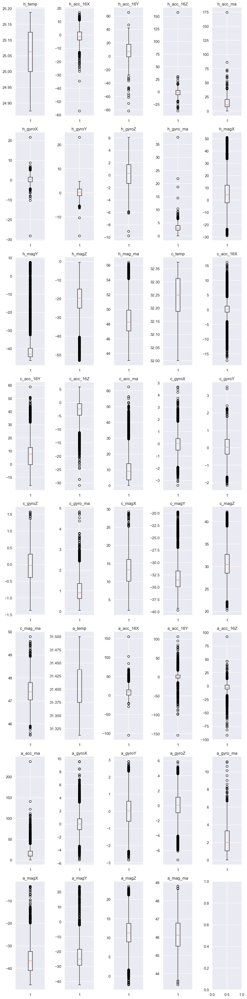

In [52]:
selected_vars = ['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
fig, axs = plt.subplots(nrows=8, ncols=5, figsize=(10, 40))
for i, var in enumerate(selected_vars):
    row = i // 5
    col = i % 5
    
    ax = axs[row, col]
    ax.boxplot(s9[var])
    ax.set_title(var)
plt.tight_layout()
plt.show()

In [41]:
s9_out = s9[(s9['h_acc_16X'] <= 10) & (s9['h_acc_16X'] >= -12) &
        (s9['h_acc_16Y'] <= 44) & (s9['h_acc_16Y'] > -25) &
        (s9['h_acc_16Z'] <= 15) & (s9['h_acc_16Z'] >= -22) &
        (s9['h_acc_ma'] <= 40) & (s9['h_acc_ma'] >= -20) &
            
        (s9['h_gyroX'] <= 7) & (s9['h_gyroX'] >= -5) &
        (s9['h_gyroY'] <= 10) & (s9['h_gyroY'] >= -6) &
        (s9['h_gyroZ'] <= 10) & (s9['h_gyroZ'] >= -6) &
        (s9['h_gyro_ma'] <= 7) & (s9['h_gyro_ma'] >= -6) & 
            
        (s9['h_magX'] <= 33) & (s9['h_magX'] >= -23) &            
        (s9['h_magY'] <= -30) & (s9['h_magY'] >= -105) &
        (s9['h_magZ'] <= 40) & (s9['h_magZ'] >= -40) &
        (s9['h_mag_ma'] <= 80) & (s9['h_mag_ma'] >= -54) &
            
        (s9['c_acc_16X'] <= 5) & (s9['c_acc_16X'] >= -5) &
        (s9['c_acc_16Y'] <= 32) & (s9['c_acc_16Y'] >= -45) &
        (s9['c_acc_16Z'] <= 40) & (s9['c_acc_16Z'] >= -10) &
        (s9['c_acc_ma'] <= 30) & (s9['c_acc_ma'] >= -10) &
            
        (s9['c_gyroX'] <= 2) & (s9['c_gyroX'] >= -2) &
        (s9['c_gyroY'] <= 2) & (s9['c_gyroY'] >= -1.8) &
        (s9['c_gyroZ'] <= 1.5) & (s9['c_gyroZ'] >= -6) &
        (s9['c_gyro_ma'] <= 2.5) & (s9['c_gyro_ma'] >= -6) & 
            
        (s9['c_magX'] <= 25) & (s9['c_magX'] >= 0) &    
        (s9['c_magY'] <= -27.5) & (s9['c_magY'] >= -40) &  
        (s9['c_magZ'] <= 39) & (s9['c_magZ'] >= 23) & 
         (s9['c_mag_ma'] <= 49) & (s9['c_mag_ma'] >= 46) & 

        (s9['a_acc_16X'] <= 40) & (s9['a_acc_16X'] >= -25) &
        (s9['a_acc_16Y'] <= 15) & (s9['a_acc_16Y'] >= -15) &
        (s9['a_acc_16Z'] <= 20) & (s9['a_acc_16Z'] >= -20) &
        (s9['a_acc_ma'] <= 50) & (s9['a_acc_ma'] >= -30) &
            
        (s9['a_gyroX'] <= 4) & (s9['a_gyroX'] >= -3) &
        (s9['a_gyroY'] <= 2.4) & (s9['a_gyroY'] >= -2.4) &
        (s9['a_gyroZ'] <= 4) & (s9['a_gyroZ'] >= -4) &
       (s9['a_gyro_ma'] <= 7) & (s9['a_gyro_ma'] >= -4) &
            
        (s9['a_magX'] <= -20) & (s9['a_magX'] >= -80) &
        (s9['a_magY'] <= 0) & (s9['a_magY'] >= -60) &
        (s9['a_magZ'] <= 25) & (s9['a_magZ'] >= 2)]
s9_out .shape

(2660, 44)

 <font color=black size=4 >**6) Merger all dataset in one dataframe**

In [42]:
# 969281
dataframes = [s1_out, s2_out, s5_out, s8_out, s9_out]
df2= pd.concat(dataframes)
df2

,timestamp,subjectID,activityID,activity_name,heart rate,h_temp,h_acc_16X,h_acc_16Y,h_acc_16Z,h_acc_ma,...,a_acc_16Z,a_acc_ma,a_gyro_ma,a_gyroX,a_gyroY,a_gyroZ,a_magX,a_magY,a_magZ,a_mag_ma
2828,38.16,1,1,lying,101.0,30.3750,2.48446,8.30637,4.62928,9.828457,...,0.056250,9.851814,0.011931,-0.006726,-0.009481,0.002686,-61.1030,-37.0876,-58.1245,92.127760
2829,38.17,1,1,lying,101.0,30.3750,2.41664,7.70294,4.97669,9.483822,...,-0.136998,9.839759,0.027181,0.025056,-0.000207,-0.010535,-61.4511,-36.3016,-58.2370,92.117273
2830,38.18,1,1,lying,101.0,30.3750,2.56915,7.32339,5.09572,9.284338,...,0.017495,9.821095,0.042027,0.006158,-0.029808,-0.028981,-61.2282,-36.8464,-59.3587,92.897820
2831,38.19,1,1,lying,101.0,30.3750,2.29091,6.95304,5.86255,9.378834,...,-0.059944,9.811658,0.051196,0.006871,-0.039702,0.031584,-61.6681,-36.9526,-58.4898,92.679587
2832,38.20,1,1,lying,101.0,30.3750,2.27665,7.07285,6.51621,9.882780,...,-0.019882,9.982500,0.041121,0.027545,0.021204,0.021969,-61.5491,-36.7524,-57.2508,91.742491
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1603320,92.86,9,24,rope jumping,161.0,25.1875,-1.41671,7.29090,-2.00707,7.693674,...,-4.212120,9.327125,1.501354,-0.185253,0.481911,1.409790,-39.3419,-20.0337,15.0508,46.643979
1603321,92.87,9,24,rope jumping,161.0,25.1875,-1.50164,6.72105,-2.16037,7.217661,...,-3.627810,9.357945,1.468393,-0.168161,0.541608,1.354460,-39.7403,-19.8885,13.9146,46.566726
1603322,92.88,9,24,rope jumping,161.0,25.1875,-1.64665,6.83738,-2.00898,7.314180,...,-3.206180,8.907125,1.345941,-0.073684,0.523076,1.237950,-41.0266,-19.1793,14.3348,47.502778
1603323,92.89,9,24,rope jumping,161.0,25.1875,-1.97874,7.03137,-1.82217,7.528338,...,-2.627380,8.819967,1.206967,-0.029322,0.429214,1.127690,-40.7785,-18.5463,14.9022,47.211512


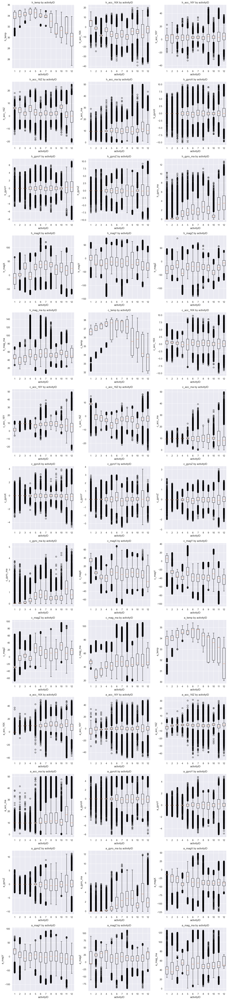

In [43]:
# Recheck the overall outliers
selected_vars =['h_temp', 
                 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z','h_acc_ma', 
                 'h_gyroX', 'h_gyroY', 'h_gyroZ', 'h_gyro_ma',
                 'h_magX','h_magY','h_magZ', 'h_mag_ma',
                 'c_temp',
                 'c_acc_16X','c_acc_16Y','c_acc_16Z','c_acc_ma',
                 'c_gyroX','c_gyroY', 'c_gyroZ', 'c_gyro_ma', 
                 'c_magX', 'c_magY','c_magZ', 'c_mag_ma',
                 'a_temp',
                 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z','a_acc_ma', 
                 'a_gyroX', 'a_gyroY','a_gyroZ',  'a_gyro_ma',
                 'a_magX', 'a_magY', 'a_magZ','a_mag_ma']
category_var = 'activityID'
num_rows = (len(selected_vars) + 2) // 3
num_cols = 3
fig, axs = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 5*num_rows))

for i, var in enumerate(selected_vars):
    row = i // 3
    col = i % 3
    ax = axs[row, col]
    ax.boxplot([df2[var][df2[category_var] == category] for category in df2[category_var].unique()])
    ax.set_title(f'{var} by {category_var}')
    ax.set_xlabel(category_var)
    ax.set_ylabel(var)

plt.tight_layout()
plt.show()

In [44]:
df_out = df[(df['h_acc_16X'] <= 18) & (df['h_acc_16X'] >= -30) &
        (df['h_acc_16Y'] <= 30) & (df['h_acc_16Y'] > -25) &
        (df['h_acc_16Z'] <= 18) & (df['h_acc_16Z'] >= -18) &
        (df['h_acc_ma'] <= 30) & (df['h_acc_ma'] >= -20) &
            
        (df['h_gyroX'] <= 7) & (df['h_gyroX'] >= -5) &
        (df['h_gyroY'] <=6) & (df['h_gyroY'] >= -5.5) &
        (df['h_gyroZ'] <=7.5) & (df['h_gyroZ'] >= -7.5) &
        (df['h_gyro_ma'] <= 10) & (df['h_gyro_ma'] >= -6) & 
            
        (df['h_magX'] <= 100) & (df['h_magX'] >= -52) &            
        (df['h_magY'] <= 70) & (df['h_magY'] >= -100) &
        (df['h_magZ'] <= 50) & (df['h_magZ'] >= -100) &
        (df['h_mag_ma'] <= 100) & (df['h_mag_ma'] >= 10) &
            
        (df['c_acc_16X'] <= 7.5) & (df['c_acc_16X'] >= -7.5) &
        (df['c_acc_16Y'] <= 40) & (df['c_acc_16Y'] >= -18) &
        (df['c_acc_16Z'] <= 10) & (df['c_acc_16Z'] >= -15) &
        (df['c_acc_ma'] <= 35) & (df['c_acc_ma'] >= -10) &
            
        (df['c_gyroX'] <= 2) & (df['c_gyroX'] >= -2) &
        #(df['c_gyroY'] <= 2) & (df['c_gyroY'] >= -1.8) &
        (df['c_gyroZ'] <= 2) & (df['c_gyroZ'] >= -2) &
        (df['c_gyro_ma'] <= 4) & (df['c_gyro_ma'] >= -6) & 
            
        (df['c_magX'] <= 70) & (df['c_magX'] >=-60) &    
        (df['c_magY'] <= 20) & (df['c_magY'] >= -80) &  
        (df['c_magZ'] <= 80) & (df['c_magZ'] >= -60) & 
         (df['c_mag_ma'] <= 90) & (df['c_mag_ma'] >= -46) & 

        (df['a_acc_16X'] <= 38) & (df['a_acc_16X'] >= -18) &
        (df['a_acc_16Y'] <= 25) & (df['a_acc_16Y'] >= -25) &
        (df['a_acc_16Z'] <= 10) & (df['a_acc_16Z'] >= -20) &
        (df['a_acc_ma'] <= 45) & (df['a_acc_ma'] >= -30) &
            
        (df['a_gyroX'] <= 4) & (df['a_gyroX'] >= -5) &
        (df['a_gyroY'] <= 3.4) & (df['a_gyroY'] >= -3.4) &
        #(df['a_gyroZ'] <= 4) & (df['a_gyroZ'] >= -4) &
       (df['a_gyro_ma'] <= 12) & (df['a_gyro_ma'] >= -4) &
            
        (df['a_magX'] <= 25) & (df['a_magX'] >= -100) &
        (df['a_magY'] <= 80) & (df['a_magY'] >= -80) &
        (df['a_magZ'] <= 100) & (df['a_magZ'] >= -65) &
        (df['a_mag_ma'] <= 110) & (df['a_mag_ma'] >= -65)]
df_out .shape

(932335, 44)

In [45]:
activity_counts=df_out.groupby(['activity_name']).size().reset_index(name='count')
print(activity_counts)

        activity_name   count
0      Nordic walking   95301
1    ascending stairs   52588
2             cycling   95572
3   descending stairs   44244
4             ironing  105971
5               lying   92498
6        rope jumping   30236
7             running   40467
8             sitting   94545
9            standing   87839
10    vacuum cleaning   89057
11            walking  104017


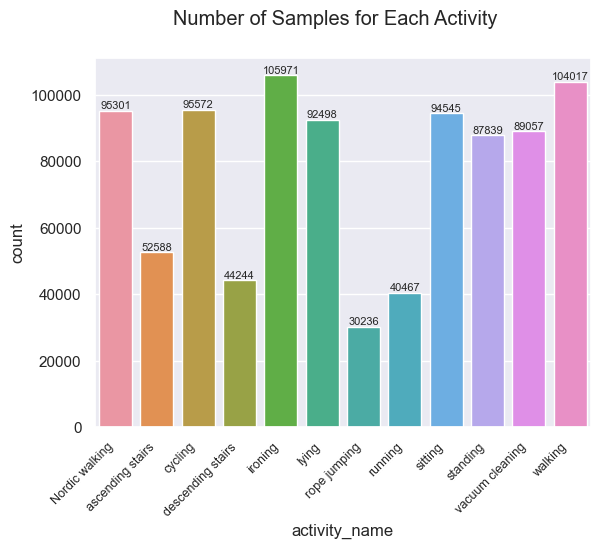

In [46]:
sns.barplot(data=activity_counts, x='activity_name',y='count')
for index, row in activity_counts.iterrows():
    plt.annotate(row['count'], (index, row['count']), ha='center', va='bottom', fontsize=8)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.suptitle('Number of Samples for Each Activity')
plt.show()

In [51]:
df_out.columns

Index(['timestamp', 'subjectID', 'activityID', 'activity_name', 'heart rate',
       'h_temp', 'h_acc_16X', 'h_acc_16Y', 'h_acc_16Z', 'h_acc_ma', 'h_gyroX',
       'h_gyroY', 'h_gyroZ', 'h_gyro_ma', 'h_magX', 'h_magY', 'h_magZ',
       'h_mag_ma', 'c_temp', 'c_acc_16X', 'c_acc_16Y', 'c_acc_16Z', 'c_acc_ma',
       'c_gyroX', 'c_gyroY', 'c_gyroZ', 'c_gyro_ma', 'c_magX', 'c_magY',
       'c_magZ', 'c_mag_ma', 'a_temp', 'a_acc_16X', 'a_acc_16Y', 'a_acc_16Z',
       'a_acc_ma', 'a_gyro_ma', 'a_gyroX', 'a_gyroY', 'a_gyroZ', 'a_magX',
       'a_magY', 'a_magZ', 'a_mag_ma'],
      dtype='object')

In [57]:
df_out.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 932335 entries, 2828 to 1603494
Data columns (total 44 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   timestamp      932335 non-null  float64
 1   subjectID      932335 non-null  int32  
 2   activityID     932335 non-null  object 
 3   activity_name  932335 non-null  object 
 4   heart rate     932335 non-null  float64
 5   h_temp         932335 non-null  float64
 6   h_acc_16X      932335 non-null  float64
 7   h_acc_16Y      932335 non-null  float64
 8   h_acc_16Z      932335 non-null  float64
 9   h_acc_ma       932335 non-null  float64
 10  h_gyroX        932335 non-null  float64
 11  h_gyroY        932335 non-null  float64
 12  h_gyroZ        932335 non-null  float64
 13  h_gyro_ma      932335 non-null  float64
 14  h_magX         932335 non-null  float64
 15  h_magY         932335 non-null  float64
 16  h_magZ         932335 non-null  float64
 17  h_mag_ma       932335 non

 <font color=black size=4 >**7) Export Cleaning Data**

In [61]:
df_out.to_csv('0708Physical activity.dat', index=False)

<font color=black size=4 >**Summary of Part 1** <br/>
<font color=black size=3 >&emsp;There are also some data points seem to be the outliers accroding to the boxplot. But I keep them in the dataset since these 'outliers' maybe not the error but the changes caused by environment like temperature, weather or atmospheric pressure, or caused by physical condition.<br/>